## Germany PV Cut Scenario with 130 €/t CO2 price

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [2]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\27032024_5nodes_co2price\\elec_s_5_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_5_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [3]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [4]:
#n.global_constraints.loc['CO2Limit','constant'] = 184500000 #TCO2 184500000

In [5]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 10 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 13 entries
Component 'Load' has 5 entries
Component 'Generator' has 71 entries
Component 'StorageUnit' has 12 entries
Component 'Store' has 5 entries


In [6]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [7]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [8]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:02<00:00,  5.90it/s]
INFO:linopy.io: Writing time: 11.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n0foskx0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n0foskx0.lp


Reading time = 5.91 seconds


INFO:gurobipy:Reading time = 5.91 seconds


obj: 849796 rows, 402989 columns, 1564774 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1564774 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


Model fingerprint: 0xfb5f1f05


INFO:gurobipy:Model fingerprint: 0xfb5f1f05


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 593259 rows and 102680 columns


INFO:gurobipy:Presolve removed 593259 rows and 102680 columns


Presolve time: 2.78s


INFO:gurobipy:Presolve time: 2.78s


Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.54s


INFO:gurobipy:Ordering time: 0.54s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 50


INFO:gurobipy: Dense cols : 50


 AA' NZ     : 8.547e+05


INFO:gurobipy: AA' NZ     : 8.547e+05


 Factor NZ  : 4.351e+06 (roughly 260 MB of memory)


INFO:gurobipy: Factor NZ  : 4.351e+06 (roughly 260 MB of memory)


 Factor Ops : 2.620e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.620e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.40430300e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     5s


INFO:gurobipy:   0   1.40430300e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     5s


   1   1.28811437e+17 -7.71653622e+17  4.16e+09 2.23e+04  3.53e+13     5s


INFO:gurobipy:   1   1.28811437e+17 -7.71653622e+17  4.16e+09 2.23e+04  3.53e+13     5s


   2   1.10815650e+17 -5.63579565e+17  3.15e+09 1.47e+04  2.59e+13     6s


INFO:gurobipy:   2   1.10815650e+17 -5.63579565e+17  3.15e+09 1.47e+04  2.59e+13     6s


   3   8.95648433e+16 -2.46894877e+17  1.67e+09 3.49e+03  1.27e+13     6s


INFO:gurobipy:   3   8.95648433e+16 -2.46894877e+17  1.67e+09 3.49e+03  1.27e+13     6s


   4   5.66617403e+16 -4.44806612e+16  3.40e+08 5.68e+02  2.65e+12     7s


INFO:gurobipy:   4   5.66617403e+16 -4.44806612e+16  3.40e+08 5.68e+02  2.65e+12     7s


   5   1.08672052e+16 -6.73515568e+15  1.41e+07 1.22e+02  1.65e+11     7s


INFO:gurobipy:   5   1.08672052e+16 -6.73515568e+15  1.41e+07 1.22e+02  1.65e+11     7s


   6   3.06484933e+15 -5.35895122e+14  2.66e+05 7.42e+00  9.29e+09     8s


INFO:gurobipy:   6   3.06484933e+15 -5.35895122e+14  2.66e+05 7.42e+00  9.29e+09     8s


   7   7.02934741e+14 -1.49794005e+14  4.23e+04 1.02e+00  1.70e+09     9s


INFO:gurobipy:   7   7.02934741e+14 -1.49794005e+14  4.23e+04 1.02e+00  1.70e+09     9s


   8   5.75476055e+14 -5.03422449e+13  3.44e+04 1.34e-01  1.16e+09     9s


INFO:gurobipy:   8   5.75476055e+14 -5.03422449e+13  3.44e+04 1.34e-01  1.16e+09     9s


   9   2.52736061e+13 -2.35961502e+13  7.30e+02 3.02e-04  7.86e+07    10s


INFO:gurobipy:   9   2.52736061e+13 -2.35961502e+13  7.30e+02 3.02e-04  7.86e+07    10s


  10   1.97705420e+12 -1.85419424e+12  5.49e+01 1.69e-05  5.95e+06    10s


INFO:gurobipy:  10   1.97705420e+12 -1.85419424e+12  5.49e+01 1.69e-05  5.95e+06    10s


  11   1.45635891e+12 -3.42400936e+11  4.00e+01 2.42e-06  2.78e+06    11s


INFO:gurobipy:  11   1.45635891e+12 -3.42400936e+11  4.00e+01 2.42e-06  2.78e+06    11s


  12   7.90226456e+11 -1.40733896e+11  2.13e+01 9.42e-07  1.44e+06    11s


INFO:gurobipy:  12   7.90226456e+11 -1.40733896e+11  2.13e+01 9.42e-07  1.44e+06    11s


  13   5.19357472e+11 -1.10598203e+11  1.37e+01 7.58e-07  9.71e+05    11s


INFO:gurobipy:  13   5.19357472e+11 -1.10598203e+11  1.37e+01 7.58e-07  9.71e+05    11s


  14   2.68535599e+11 -6.25229475e+10  6.33e+00 4.57e-07  5.10e+05    12s


INFO:gurobipy:  14   2.68535599e+11 -6.25229475e+10  6.33e+00 4.57e-07  5.10e+05    12s


  15   1.04606123e+11 -4.03696508e+10  2.02e+00 3.17e-07  2.23e+05    12s


INFO:gurobipy:  15   1.04606123e+11 -4.03696508e+10  2.02e+00 3.17e-07  2.23e+05    12s


  16   8.01247132e+10  1.80095169e+09  1.47e+00 7.78e-08  1.21e+05    13s


INFO:gurobipy:  16   8.01247132e+10  1.80095169e+09  1.47e+00 7.78e-08  1.21e+05    13s


  17   6.07488502e+10  8.40341936e+09  1.01e+00 4.63e-08  8.06e+04    13s


INFO:gurobipy:  17   6.07488502e+10  8.40341936e+09  1.01e+00 4.63e-08  8.06e+04    13s


  18   5.20441951e+10  1.01256123e+10  7.88e-01 3.95e-08  6.45e+04    14s


INFO:gurobipy:  18   5.20441951e+10  1.01256123e+10  7.88e-01 3.95e-08  6.45e+04    14s


  19   4.55434636e+10  1.32237952e+10  6.23e-01 2.74e-08  4.97e+04    14s


INFO:gurobipy:  19   4.55434636e+10  1.32237952e+10  6.23e-01 2.74e-08  4.97e+04    14s


  20   4.48631887e+10  1.42731282e+10  6.06e-01 2.27e-08  4.71e+04    14s


INFO:gurobipy:  20   4.48631887e+10  1.42731282e+10  6.06e-01 2.27e-08  4.71e+04    14s


  21   4.24953040e+10  1.54572370e+10  5.43e-01 1.92e-08  4.16e+04    15s


INFO:gurobipy:  21   4.24953040e+10  1.54572370e+10  5.43e-01 1.92e-08  4.16e+04    15s


  22   3.47281803e+10  1.67606849e+10  3.60e-01 1.47e-08  2.77e+04    15s


INFO:gurobipy:  22   3.47281803e+10  1.67606849e+10  3.60e-01 1.47e-08  2.77e+04    15s


  23   3.26212305e+10  1.81169932e+10  3.07e-01 1.09e-08  2.23e+04    16s


INFO:gurobipy:  23   3.26212305e+10  1.81169932e+10  3.07e-01 1.09e-08  2.23e+04    16s


  24   2.91609165e+10  1.88461548e+10  2.15e-01 8.31e-09  1.59e+04    17s


INFO:gurobipy:  24   2.91609165e+10  1.88461548e+10  2.15e-01 8.31e-09  1.59e+04    17s


  25   2.72463293e+10  1.95582489e+10  1.55e-01 7.16e-09  1.18e+04    17s


INFO:gurobipy:  25   2.72463293e+10  1.95582489e+10  1.55e-01 7.16e-09  1.18e+04    17s


  26   2.60398691e+10  2.00680097e+10  1.16e-01 6.21e-09  9.19e+03    18s


INFO:gurobipy:  26   2.60398691e+10  2.00680097e+10  1.16e-01 6.21e-09  9.19e+03    18s


  27   2.52484289e+10  2.05085902e+10  8.97e-02 4.46e-09  7.29e+03    18s


INFO:gurobipy:  27   2.52484289e+10  2.05085902e+10  8.97e-02 4.46e-09  7.29e+03    18s


  28   2.44902345e+10  2.07147645e+10  6.61e-02 3.63e-09  5.81e+03    19s


INFO:gurobipy:  28   2.44902345e+10  2.07147645e+10  6.61e-02 3.63e-09  5.81e+03    19s


  29   2.42034691e+10  2.10446468e+10  5.64e-02 3.55e-09  4.86e+03    20s


INFO:gurobipy:  29   2.42034691e+10  2.10446468e+10  5.64e-02 3.55e-09  4.86e+03    20s


  30   2.37905984e+10  2.11934685e+10  4.32e-02 3.43e-09  4.00e+03    20s


INFO:gurobipy:  30   2.37905984e+10  2.11934685e+10  4.32e-02 3.43e-09  4.00e+03    20s


  31   2.36078575e+10  2.13716264e+10  3.71e-02 2.82e-09  3.44e+03    21s


INFO:gurobipy:  31   2.36078575e+10  2.13716264e+10  3.71e-02 2.82e-09  3.44e+03    21s


  32   2.33783547e+10  2.14406655e+10  2.93e-02 2.44e-09  2.98e+03    22s


INFO:gurobipy:  32   2.33783547e+10  2.14406655e+10  2.93e-02 2.44e-09  2.98e+03    22s


  33   2.32816391e+10  2.15584333e+10  2.61e-02 2.08e-09  2.65e+03    22s


INFO:gurobipy:  33   2.32816391e+10  2.15584333e+10  2.61e-02 2.08e-09  2.65e+03    22s


  34   2.32037009e+10  2.16692415e+10  2.35e-02 2.21e-09  2.36e+03    23s


INFO:gurobipy:  34   2.32037009e+10  2.16692415e+10  2.35e-02 2.21e-09  2.36e+03    23s


  35   2.30996870e+10  2.17550802e+10  2.01e-02 2.04e-09  2.07e+03    23s


INFO:gurobipy:  35   2.30996870e+10  2.17550802e+10  2.01e-02 2.04e-09  2.07e+03    23s


  36   2.30205775e+10  2.18406571e+10  1.76e-02 2.02e-09  1.82e+03    24s


INFO:gurobipy:  36   2.30205775e+10  2.18406571e+10  1.76e-02 2.02e-09  1.82e+03    24s


  37   2.29272827e+10  2.18884355e+10  1.46e-02 1.51e-09  1.60e+03    24s


INFO:gurobipy:  37   2.29272827e+10  2.18884355e+10  1.46e-02 1.51e-09  1.60e+03    24s


  38   2.29008545e+10  2.19329118e+10  1.37e-02 2.11e-09  1.49e+03    24s


INFO:gurobipy:  38   2.29008545e+10  2.19329118e+10  1.37e-02 2.11e-09  1.49e+03    24s


  39   2.28647601e+10  2.19438015e+10  1.25e-02 1.99e-09  1.42e+03    25s


INFO:gurobipy:  39   2.28647601e+10  2.19438015e+10  1.25e-02 1.99e-09  1.42e+03    25s


  40   2.28270898e+10  2.19851043e+10  1.13e-02 1.03e-09  1.30e+03    25s


INFO:gurobipy:  40   2.28270898e+10  2.19851043e+10  1.13e-02 1.03e-09  1.30e+03    25s


  41   2.27915953e+10  2.20435084e+10  1.01e-02 1.92e-09  1.15e+03    26s


INFO:gurobipy:  41   2.27915953e+10  2.20435084e+10  1.01e-02 1.92e-09  1.15e+03    26s


  42   2.27606361e+10  2.20805715e+10  9.19e-03 2.71e-09  1.05e+03    26s


INFO:gurobipy:  42   2.27606361e+10  2.20805715e+10  9.19e-03 2.71e-09  1.05e+03    26s


  43   2.27152194e+10  2.21009354e+10  7.77e-03 1.91e-09  9.45e+02    27s


INFO:gurobipy:  43   2.27152194e+10  2.21009354e+10  7.77e-03 1.91e-09  9.45e+02    27s


  44   2.26943481e+10  2.21601270e+10  7.09e-03 6.48e-10  8.22e+02    28s


INFO:gurobipy:  44   2.26943481e+10  2.21601270e+10  7.09e-03 6.48e-10  8.22e+02    28s


  45   2.26647029e+10  2.21745759e+10  6.18e-03 5.20e-10  7.54e+02    28s


INFO:gurobipy:  45   2.26647029e+10  2.21745759e+10  6.18e-03 5.20e-10  7.54e+02    28s


  46   2.26359735e+10  2.21955471e+10  5.33e-03 9.82e-10  6.78e+02    29s


INFO:gurobipy:  46   2.26359735e+10  2.21955471e+10  5.33e-03 9.82e-10  6.78e+02    29s


  47   2.26243233e+10  2.22110488e+10  5.00e-03 1.65e-09  6.36e+02    31s


INFO:gurobipy:  47   2.26243233e+10  2.22110488e+10  5.00e-03 1.65e-09  6.36e+02    31s


  48   2.26131019e+10  2.22307689e+10  4.69e-03 1.46e-09  5.88e+02    32s


INFO:gurobipy:  48   2.26131019e+10  2.22307689e+10  4.69e-03 1.46e-09  5.88e+02    32s


  49   2.25947391e+10  2.22785281e+10  4.12e-03 3.61e-10  4.87e+02    33s


INFO:gurobipy:  49   2.25947391e+10  2.22785281e+10  4.12e-03 3.61e-10  4.87e+02    33s


  50   2.25718190e+10  2.22952420e+10  3.44e-03 8.00e-10  4.26e+02    34s


INFO:gurobipy:  50   2.25718190e+10  2.22952420e+10  3.44e-03 8.00e-10  4.26e+02    34s


  51   2.25604883e+10  2.23027149e+10  3.09e-03 1.24e-09  3.97e+02    35s


INFO:gurobipy:  51   2.25604883e+10  2.23027149e+10  3.09e-03 1.24e-09  3.97e+02    35s


  52   2.25560926e+10  2.23195535e+10  2.96e-03 4.58e-10  3.64e+02    35s


INFO:gurobipy:  52   2.25560926e+10  2.23195535e+10  2.96e-03 4.58e-10  3.64e+02    35s


  53   2.25397474e+10  2.23293889e+10  2.49e-03 8.44e-10  3.24e+02    36s


INFO:gurobipy:  53   2.25397474e+10  2.23293889e+10  2.49e-03 8.44e-10  3.24e+02    36s


  54   2.25355921e+10  2.23431019e+10  2.33e-03 7.86e-10  2.96e+02    37s


INFO:gurobipy:  54   2.25355921e+10  2.23431019e+10  2.33e-03 7.86e-10  2.96e+02    37s


  55   2.25263190e+10  2.23500723e+10  2.06e-03 7.05e-10  2.71e+02    38s


INFO:gurobipy:  55   2.25263190e+10  2.23500723e+10  2.06e-03 7.05e-10  2.71e+02    38s


  56   2.25219294e+10  2.23544971e+10  1.94e-03 6.04e-10  2.58e+02    38s


INFO:gurobipy:  56   2.25219294e+10  2.23544971e+10  1.94e-03 6.04e-10  2.58e+02    38s


  57   2.25159451e+10  2.23665558e+10  1.76e-03 1.05e-09  2.30e+02    39s


INFO:gurobipy:  57   2.25159451e+10  2.23665558e+10  1.76e-03 1.05e-09  2.30e+02    39s


  58   2.25110039e+10  2.23755231e+10  1.61e-03 1.16e-09  2.08e+02    43s


INFO:gurobipy:  58   2.25110039e+10  2.23755231e+10  1.61e-03 1.16e-09  2.08e+02    43s


  59   2.25062959e+10  2.23810506e+10  1.47e-03 5.38e-10  1.93e+02    44s


INFO:gurobipy:  59   2.25062959e+10  2.23810506e+10  1.47e-03 5.38e-10  1.93e+02    44s


  60   2.25020807e+10  2.23852348e+10  1.34e-03 1.47e-09  1.80e+02    44s


INFO:gurobipy:  60   2.25020807e+10  2.23852348e+10  1.34e-03 1.47e-09  1.80e+02    44s


  61   2.24968955e+10  2.23909508e+10  1.17e-03 9.97e-10  1.63e+02    46s


INFO:gurobipy:  61   2.24968955e+10  2.23909508e+10  1.17e-03 9.97e-10  1.63e+02    46s


  62   2.24926498e+10  2.23943725e+10  1.05e-03 1.41e-09  1.51e+02    47s


INFO:gurobipy:  62   2.24926498e+10  2.23943725e+10  1.05e-03 1.41e-09  1.51e+02    47s


  63   2.24902143e+10  2.23994082e+10  9.72e-04 1.63e-09  1.40e+02    48s


INFO:gurobipy:  63   2.24902143e+10  2.23994082e+10  9.72e-04 1.63e-09  1.40e+02    48s


  64   2.24873439e+10  2.24016004e+10  8.93e-04 2.03e-09  1.32e+02    48s


INFO:gurobipy:  64   2.24873439e+10  2.24016004e+10  8.93e-04 2.03e-09  1.32e+02    48s


  65   2.24866084e+10  2.24066191e+10  8.69e-04 6.69e-10  1.23e+02    49s


INFO:gurobipy:  65   2.24866084e+10  2.24066191e+10  8.69e-04 6.69e-10  1.23e+02    49s


  66   2.24833406e+10  2.24096524e+10  7.66e-04 3.15e-10  1.13e+02    49s


INFO:gurobipy:  66   2.24833406e+10  2.24096524e+10  7.66e-04 3.15e-10  1.13e+02    49s


  67   2.24814378e+10  2.24130767e+10  7.06e-04 4.08e-10  1.05e+02    50s


INFO:gurobipy:  67   2.24814378e+10  2.24130767e+10  7.06e-04 4.08e-10  1.05e+02    50s


  68   2.24801535e+10  2.24192677e+10  6.60e-04 7.71e-10  9.37e+01    50s


INFO:gurobipy:  68   2.24801535e+10  2.24192677e+10  6.60e-04 7.71e-10  9.37e+01    50s


  69   2.24784513e+10  2.24238173e+10  5.99e-04 1.30e-09  8.41e+01    51s


INFO:gurobipy:  69   2.24784513e+10  2.24238173e+10  5.99e-04 1.30e-09  8.41e+01    51s


  70   2.24763762e+10  2.24260530e+10  5.38e-04 1.11e-09  7.74e+01    52s


INFO:gurobipy:  70   2.24763762e+10  2.24260530e+10  5.38e-04 1.11e-09  7.74e+01    52s


  71   2.24753611e+10  2.24274639e+10  5.06e-04 7.64e-10  7.37e+01    52s


INFO:gurobipy:  71   2.24753611e+10  2.24274639e+10  5.06e-04 7.64e-10  7.37e+01    52s


  72   2.24731163e+10  2.24311002e+10  4.35e-04 1.53e-09  6.47e+01    53s


INFO:gurobipy:  72   2.24731163e+10  2.24311002e+10  4.35e-04 1.53e-09  6.47e+01    53s


  73   2.24725556e+10  2.24329076e+10  4.17e-04 9.02e-10  6.10e+01    54s


INFO:gurobipy:  73   2.24725556e+10  2.24329076e+10  4.17e-04 9.02e-10  6.10e+01    54s


  74   2.24712442e+10  2.24382306e+10  3.72e-04 4.51e-10  5.08e+01    54s


INFO:gurobipy:  74   2.24712442e+10  2.24382306e+10  3.72e-04 4.51e-10  5.08e+01    54s


  75   2.24700045e+10  2.24398822e+10  3.34e-04 1.00e-09  4.64e+01    55s


INFO:gurobipy:  75   2.24700045e+10  2.24398822e+10  3.34e-04 1.00e-09  4.64e+01    55s


  76   2.24683790e+10  2.24423102e+10  2.79e-04 9.75e-10  4.01e+01    56s


INFO:gurobipy:  76   2.24683790e+10  2.24423102e+10  2.79e-04 9.75e-10  4.01e+01    56s


  77   2.24669573e+10  2.24436164e+10  2.38e-04 7.95e-10  3.59e+01    56s


INFO:gurobipy:  77   2.24669573e+10  2.24436164e+10  2.38e-04 7.95e-10  3.59e+01    56s


  78   2.24663850e+10  2.24446185e+10  2.20e-04 8.33e-10  3.35e+01    57s


INFO:gurobipy:  78   2.24663850e+10  2.24446185e+10  2.20e-04 8.33e-10  3.35e+01    57s


  79   2.24662128e+10  2.24458611e+10  2.14e-04 9.24e-10  3.13e+01    57s


INFO:gurobipy:  79   2.24662128e+10  2.24458611e+10  2.14e-04 9.24e-10  3.13e+01    57s


  80   2.24638839e+10  2.24464784e+10  1.53e-04 8.51e-10  2.68e+01    58s


INFO:gurobipy:  80   2.24638839e+10  2.24464784e+10  1.53e-04 8.51e-10  2.68e+01    58s


  81   2.24635082e+10  2.24471312e+10  1.40e-04 2.84e-10  2.52e+01    59s


INFO:gurobipy:  81   2.24635082e+10  2.24471312e+10  1.40e-04 2.84e-10  2.52e+01    59s


  82   2.24632986e+10  2.24477808e+10  1.33e-04 1.33e-09  2.39e+01    59s


INFO:gurobipy:  82   2.24632986e+10  2.24477808e+10  1.33e-04 1.33e-09  2.39e+01    59s


  83   2.24629764e+10  2.24482698e+10  1.24e-04 6.69e-10  2.26e+01    60s


INFO:gurobipy:  83   2.24629764e+10  2.24482698e+10  1.24e-04 6.69e-10  2.26e+01    60s


  84   2.24626110e+10  2.24492919e+10  1.12e-04 5.75e-10  2.05e+01    60s


INFO:gurobipy:  84   2.24626110e+10  2.24492919e+10  1.12e-04 5.75e-10  2.05e+01    60s


  85   2.24623069e+10  2.24499144e+10  1.03e-04 1.74e-09  1.91e+01    61s


INFO:gurobipy:  85   2.24623069e+10  2.24499144e+10  1.03e-04 1.74e-09  1.91e+01    61s


  86   2.24620383e+10  2.24509793e+10  9.43e-05 2.87e-10  1.70e+01    62s


INFO:gurobipy:  86   2.24620383e+10  2.24509793e+10  9.43e-05 2.87e-10  1.70e+01    62s


  87   2.24615744e+10  2.24520395e+10  7.77e-05 1.38e-09  1.47e+01    62s


INFO:gurobipy:  87   2.24615744e+10  2.24520395e+10  7.77e-05 1.38e-09  1.47e+01    62s


  88   2.24611623e+10  2.24541147e+10  6.18e-05 5.24e-10  1.08e+01    63s


INFO:gurobipy:  88   2.24611623e+10  2.24541147e+10  6.18e-05 5.24e-10  1.08e+01    63s


  89   2.24600446e+10  2.24553405e+10  4.36e-05 3.87e-10  7.24e+00    63s


INFO:gurobipy:  89   2.24600446e+10  2.24553405e+10  4.36e-05 3.87e-10  7.24e+00    63s


  90   2.24599305e+10  2.24554974e+10  3.72e-05 2.31e-10  6.82e+00    64s


INFO:gurobipy:  90   2.24599305e+10  2.24554974e+10  3.72e-05 2.31e-10  6.82e+00    64s


  91   2.24598379e+10  2.24557881e+10  3.28e-05 9.39e-10  6.23e+00    64s


INFO:gurobipy:  91   2.24598379e+10  2.24557881e+10  3.28e-05 9.39e-10  6.23e+00    64s


  92   2.24598005e+10  2.24558986e+10  3.06e-05 8.22e-10  6.00e+00    65s


INFO:gurobipy:  92   2.24598005e+10  2.24558986e+10  3.06e-05 8.22e-10  6.00e+00    65s


  93   2.24597157e+10  2.24561362e+10  2.67e-05 6.62e-10  5.51e+00    66s


INFO:gurobipy:  93   2.24597157e+10  2.24561362e+10  2.67e-05 6.62e-10  5.51e+00    66s


  94   2.24596271e+10  2.24567124e+10  2.33e-05 2.84e-10  4.49e+00    66s


INFO:gurobipy:  94   2.24596271e+10  2.24567124e+10  2.33e-05 2.84e-10  4.49e+00    66s


  95   2.24594429e+10  2.24571148e+10  1.53e-05 7.64e-10  3.58e+00    67s


INFO:gurobipy:  95   2.24594429e+10  2.24571148e+10  1.53e-05 7.64e-10  3.58e+00    67s


  96   2.24594251e+10  2.24573240e+10  1.46e-05 1.69e-09  3.23e+00    69s


INFO:gurobipy:  96   2.24594251e+10  2.24573240e+10  1.46e-05 1.69e-09  3.23e+00    69s


  97   2.24594002e+10  2.24573611e+10  1.36e-05 6.48e-10  3.14e+00    70s


INFO:gurobipy:  97   2.24594002e+10  2.24573611e+10  1.36e-05 6.48e-10  3.14e+00    70s


  98   2.24593831e+10  2.24577208e+10  1.30e-05 5.26e-10  2.56e+00    71s


INFO:gurobipy:  98   2.24593831e+10  2.24577208e+10  1.30e-05 5.26e-10  2.56e+00    71s


  99   2.24593376e+10  2.24577616e+10  1.10e-05 4.15e-10  2.43e+00    73s


INFO:gurobipy:  99   2.24593376e+10  2.24577616e+10  1.10e-05 4.15e-10  2.43e+00    73s


 100   2.24592344e+10  2.24584735e+10  7.58e-06 6.18e-10  1.17e+00    74s


INFO:gurobipy: 100   2.24592344e+10  2.24584735e+10  7.58e-06 6.18e-10  1.17e+00    74s


 101   2.24591340e+10  2.24586338e+10  4.48e-06 1.92e-09  7.70e-01    76s


INFO:gurobipy: 101   2.24591340e+10  2.24586338e+10  4.48e-06 1.92e-09  7.70e-01    76s


 102   2.24590541e+10  2.24587888e+10  2.47e-06 6.37e-10  4.08e-01    76s


INFO:gurobipy: 102   2.24590541e+10  2.24587888e+10  2.47e-06 6.37e-10  4.08e-01    76s


 103   2.24590519e+10  2.24587967e+10  2.41e-06 9.39e-10  3.93e-01    77s


INFO:gurobipy: 103   2.24590519e+10  2.24587967e+10  2.41e-06 9.39e-10  3.93e-01    77s


 104   2.24590324e+10  2.24588032e+10  1.87e-06 4.80e-10  3.53e-01    78s


INFO:gurobipy: 104   2.24590324e+10  2.24588032e+10  1.87e-06 4.80e-10  3.53e-01    78s


 105   2.24590184e+10  2.24588751e+10  1.49e-06 5.46e-10  2.20e-01    79s


INFO:gurobipy: 105   2.24590184e+10  2.24588751e+10  1.49e-06 5.46e-10  2.20e-01    79s


 106   2.24590076e+10  2.24588979e+10  1.18e-06 1.02e-09  1.69e-01    80s


INFO:gurobipy: 106   2.24590076e+10  2.24588979e+10  1.18e-06 1.02e-09  1.69e-01    80s


 107   2.24590050e+10  2.24589012e+10  1.11e-06 1.06e-09  1.60e-01    81s


INFO:gurobipy: 107   2.24590050e+10  2.24589012e+10  1.11e-06 1.06e-09  1.60e-01    81s


 108   2.24590002e+10  2.24589077e+10  9.87e-07 1.24e-09  1.42e-01    81s


INFO:gurobipy: 108   2.24590002e+10  2.24589077e+10  9.87e-07 1.24e-09  1.42e-01    81s


 109   2.24589984e+10  2.24589104e+10  9.37e-07 6.04e-10  1.36e-01    82s


INFO:gurobipy: 109   2.24589984e+10  2.24589104e+10  9.37e-07 6.04e-10  1.36e-01    82s


 110   2.24589965e+10  2.24589166e+10  8.88e-07 4.44e-10  1.23e-01    82s


INFO:gurobipy: 110   2.24589965e+10  2.24589166e+10  8.88e-07 4.44e-10  1.23e-01    82s


 111   2.24589962e+10  2.24589176e+10  8.82e-07 9.90e-10  1.21e-01    83s


INFO:gurobipy: 111   2.24589962e+10  2.24589176e+10  8.82e-07 9.90e-10  1.21e-01    83s


 112   2.24589960e+10  2.24589182e+10  8.76e-07 5.28e-10  1.20e-01    84s


INFO:gurobipy: 112   2.24589960e+10  2.24589182e+10  8.76e-07 5.28e-10  1.20e-01    84s


 113   2.24589959e+10  2.24589194e+10  8.72e-07 5.53e-10  1.18e-01    84s


INFO:gurobipy: 113   2.24589959e+10  2.24589194e+10  8.72e-07 5.53e-10  1.18e-01    84s


 114   2.24589956e+10  2.24589217e+10  8.65e-07 1.79e-09  1.14e-01    85s


INFO:gurobipy: 114   2.24589956e+10  2.24589217e+10  8.65e-07 1.79e-09  1.14e-01    85s


 115   2.24589952e+10  2.24589222e+10  8.54e-07 8.15e-10  1.12e-01    86s


INFO:gurobipy: 115   2.24589952e+10  2.24589222e+10  8.54e-07 8.15e-10  1.12e-01    86s


 116   2.24589939e+10  2.24589223e+10  8.11e-07 9.31e-10  1.10e-01    87s


INFO:gurobipy: 116   2.24589939e+10  2.24589223e+10  8.11e-07 9.31e-10  1.10e-01    87s


 117   2.24589901e+10  2.24589238e+10  7.19e-07 9.17e-10  1.02e-01    88s


INFO:gurobipy: 117   2.24589901e+10  2.24589238e+10  7.19e-07 9.17e-10  1.02e-01    88s


 118   2.24589794e+10  2.24589414e+10  4.33e-07 3.93e-10  5.85e-02    88s


INFO:gurobipy: 118   2.24589794e+10  2.24589414e+10  4.33e-07 3.93e-10  5.85e-02    88s


 119   2.24589717e+10  2.24589484e+10  2.49e-07 7.86e-10  3.58e-02    89s


INFO:gurobipy: 119   2.24589717e+10  2.24589484e+10  2.49e-07 7.86e-10  3.58e-02    89s


 120   2.24589681e+10  2.24589533e+10  1.64e-07 1.01e-09  2.28e-02    90s


INFO:gurobipy: 120   2.24589681e+10  2.24589533e+10  1.64e-07 1.01e-09  2.28e-02    90s


 121   2.24589646e+10  2.24589563e+10  8.82e-08 5.86e-10  1.28e-02    91s


INFO:gurobipy: 121   2.24589646e+10  2.24589563e+10  8.82e-08 5.86e-10  1.28e-02    91s


 122   2.24589637e+10  2.24589576e+10  6.77e-08 4.37e-10  9.27e-03    91s


INFO:gurobipy: 122   2.24589637e+10  2.24589576e+10  6.77e-08 4.37e-10  9.27e-03    91s


 123   2.24589627e+10  2.24589586e+10  4.66e-08 1.92e-09  6.35e-03    92s


INFO:gurobipy: 123   2.24589627e+10  2.24589586e+10  4.66e-08 1.92e-09  6.35e-03    92s


 124   2.24589620e+10  2.24589596e+10  3.47e-07 8.80e-10  3.71e-03    93s


INFO:gurobipy: 124   2.24589620e+10  2.24589596e+10  3.47e-07 8.80e-10  3.71e-03    93s


 125   2.24589612e+10  2.24589600e+10  1.79e-07 1.28e-09  1.74e-03    94s


INFO:gurobipy: 125   2.24589612e+10  2.24589600e+10  1.79e-07 1.28e-09  1.74e-03    94s


 126   2.24589609e+10  2.24589602e+10  5.42e-06 5.82e-10  1.16e-03    95s


INFO:gurobipy: 126   2.24589609e+10  2.24589602e+10  5.42e-06 5.82e-10  1.16e-03    95s


 127   2.24589608e+10  2.24589603e+10  4.23e-06 1.71e-09  7.86e-04    95s


INFO:gurobipy: 127   2.24589608e+10  2.24589603e+10  4.23e-06 1.71e-09  7.86e-04    95s


 128   2.24589608e+10  2.24589604e+10  3.14e-06 1.51e-09  5.72e-04    96s


INFO:gurobipy: 128   2.24589608e+10  2.24589604e+10  3.14e-06 1.51e-09  5.72e-04    96s


 129   2.24589607e+10  2.24589604e+10  2.38e-06 1.58e-09  4.55e-04    97s


INFO:gurobipy: 129   2.24589607e+10  2.24589604e+10  2.38e-06 1.58e-09  4.55e-04    97s


INFO:gurobipy:


Barrier solved model in 129 iterations and 96.69 seconds (22.28 work units)


INFO:gurobipy:Barrier solved model in 129 iterations and 96.69 seconds (22.28 work units)


Optimal objective 2.24589607e+10


INFO:gurobipy:Optimal objective 2.24589607e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  117987 DPushes remaining with DInf 0.0000000e+00                98s


INFO:gurobipy:  117987 DPushes remaining with DInf 0.0000000e+00                98s


    4717 DPushes remaining with DInf 0.0000000e+00               100s


INFO:gurobipy:    4717 DPushes remaining with DInf 0.0000000e+00               100s


      93 DPushes remaining with DInf 0.0000000e+00               105s


INFO:gurobipy:      93 DPushes remaining with DInf 0.0000000e+00               105s


       0 DPushes remaining with DInf 0.0000000e+00               106s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               106s


INFO:gurobipy:


  187472 PPushes remaining with PInf 0.0000000e+00               106s


INFO:gurobipy:  187472 PPushes remaining with PInf 0.0000000e+00               106s


   20907 PPushes remaining with PInf 1.1606891e-01               110s


INFO:gurobipy:   20907 PPushes remaining with PInf 1.1606891e-01               110s


       0 PPushes remaining with PInf 0.0000000e+00               115s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               115s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.5646669e+05    115s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.5646669e+05    115s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  258953    2.2458961e+10   0.000000e+00   4.564667e+05    115s


INFO:gurobipy:  258953    2.2458961e+10   0.000000e+00   4.564667e+05    115s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  260725    2.2458961e+10   0.000000e+00   4.462256e-06    120s


INFO:gurobipy:  260725    2.2458961e+10   0.000000e+00   4.462256e-06    120s


Extra simplex iterations after uncrush: 2


INFO:gurobipy:Extra simplex iterations after uncrush: 2


  260727    2.2458961e+10   0.000000e+00   0.000000e+00    121s


INFO:gurobipy:  260727    2.2458961e+10   0.000000e+00   0.000000e+00    121s


INFO:gurobipy:


Solved in 260727 iterations and 121.32 seconds (31.89 work units)


INFO:gurobipy:Solved in 260727 iterations and 121.32 seconds (31.89 work units)


Optimal objective  2.245896052e+10


INFO:gurobipy:Optimal objective  2.245896052e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [9]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [10]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


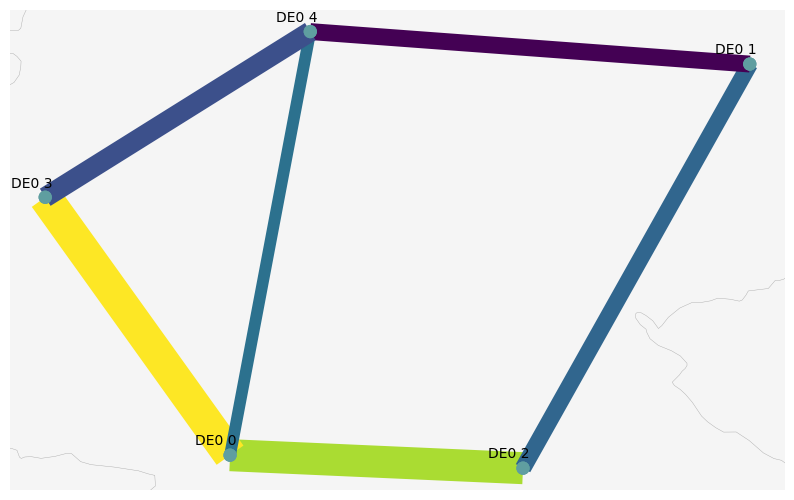

In [11]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [12]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


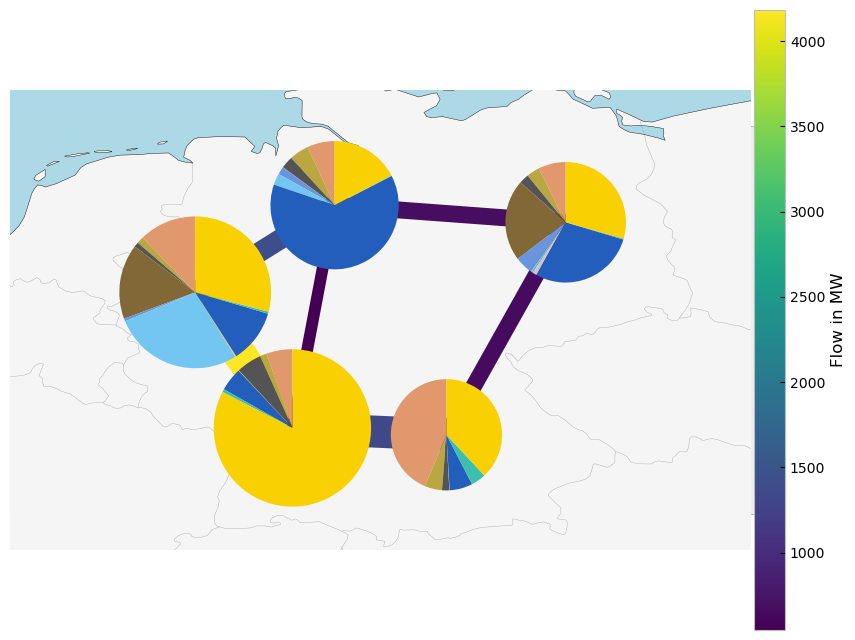

In [13]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [14]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


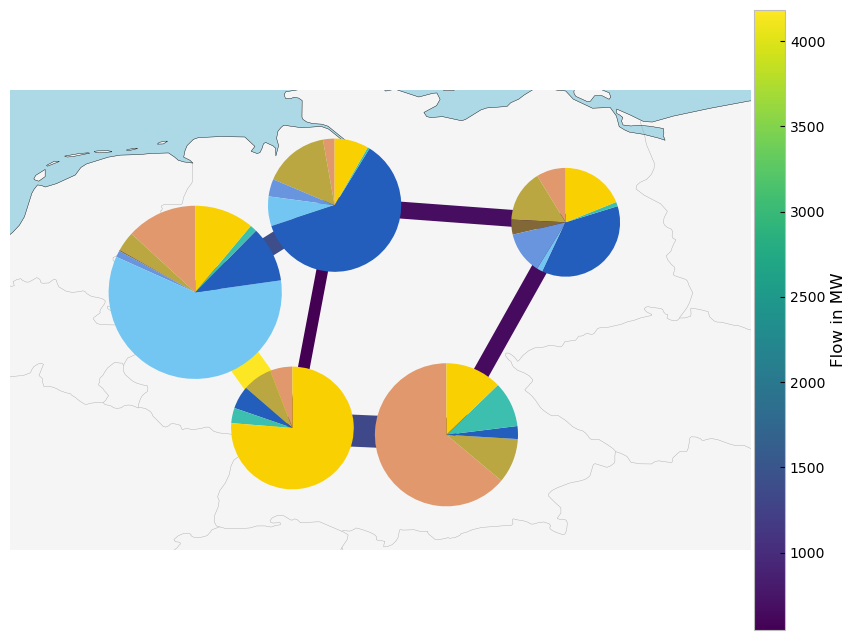

In [15]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

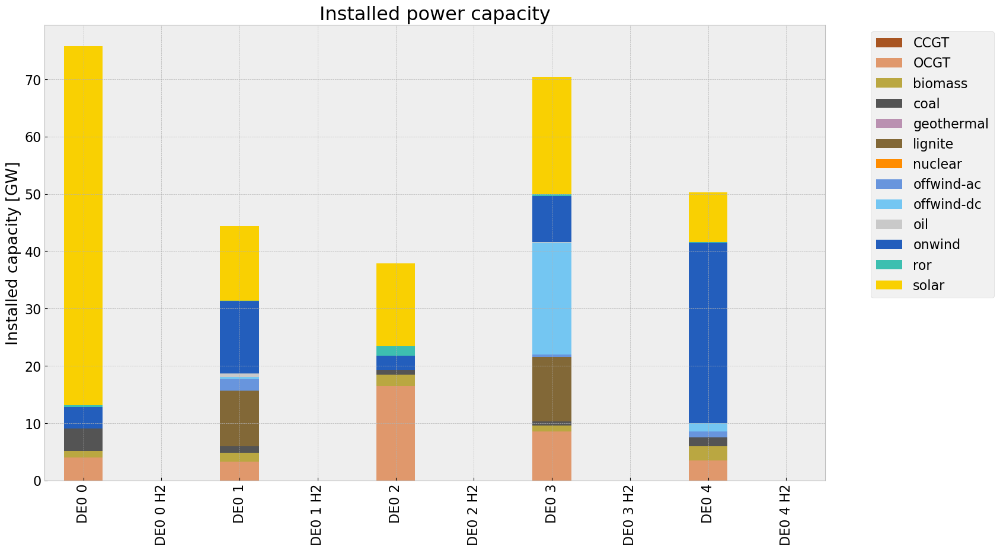

In [16]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

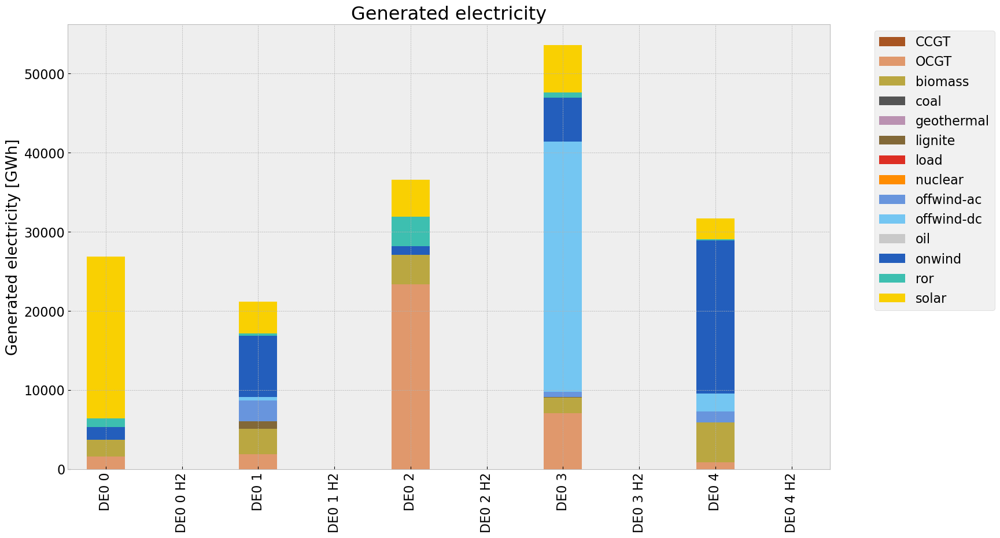

In [17]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [18]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3551839577.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3551839577.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3551839577.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()


In [19]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [20]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    links = links.drop(columns='DC', inplace=False)
    links['H2 fuel cell']*=-1
       
    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_no_H.where(p_no_H>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [21]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [22]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [23]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [24]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


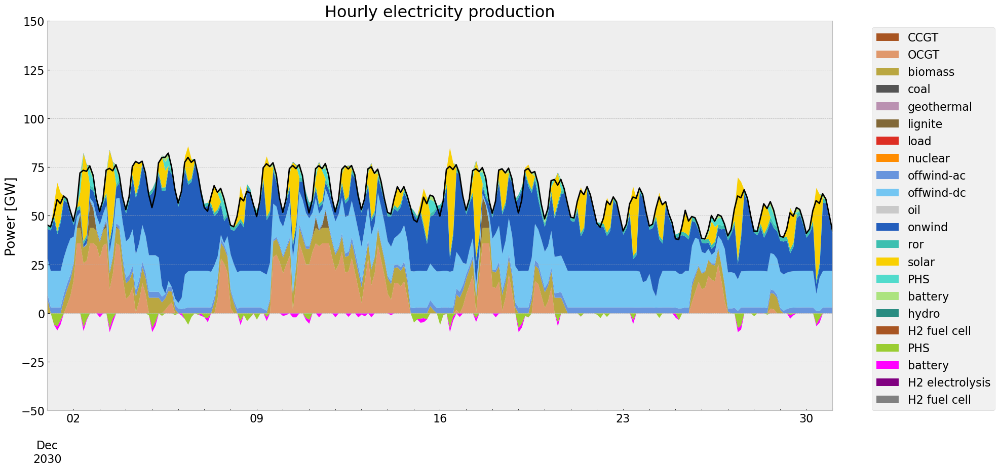

In [25]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

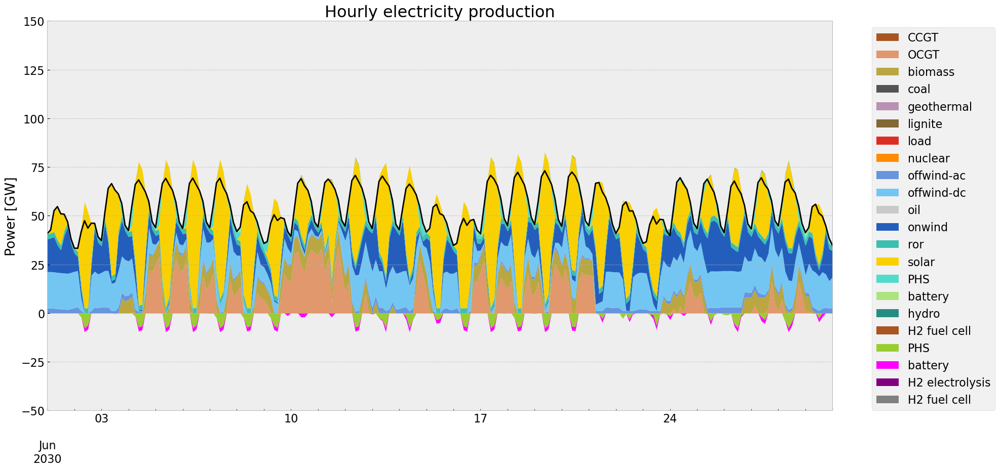

In [26]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [27]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,0.000000,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,0.000000,NaN


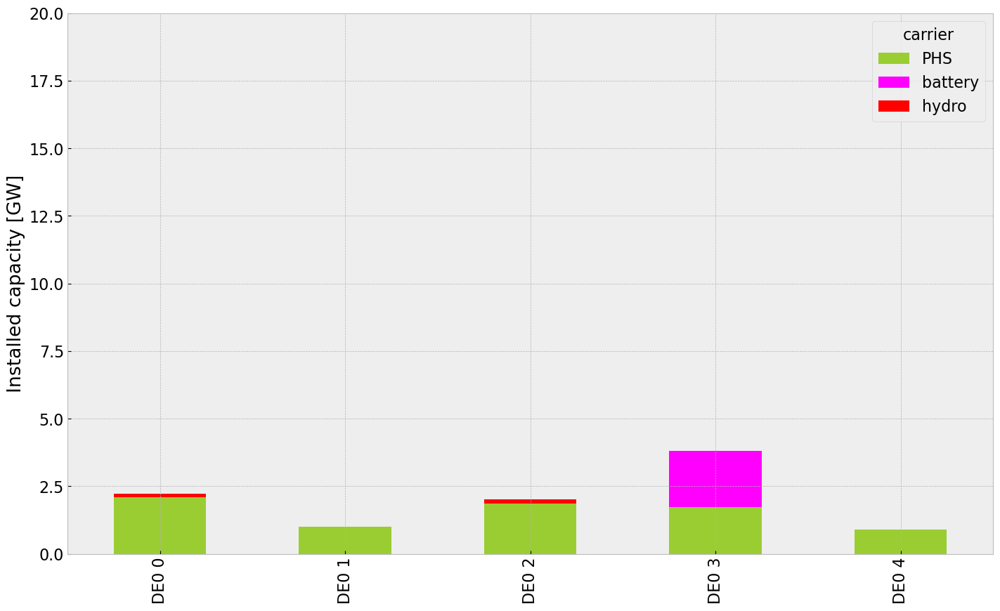

In [28]:
inst_store_table(n)

In [29]:
n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


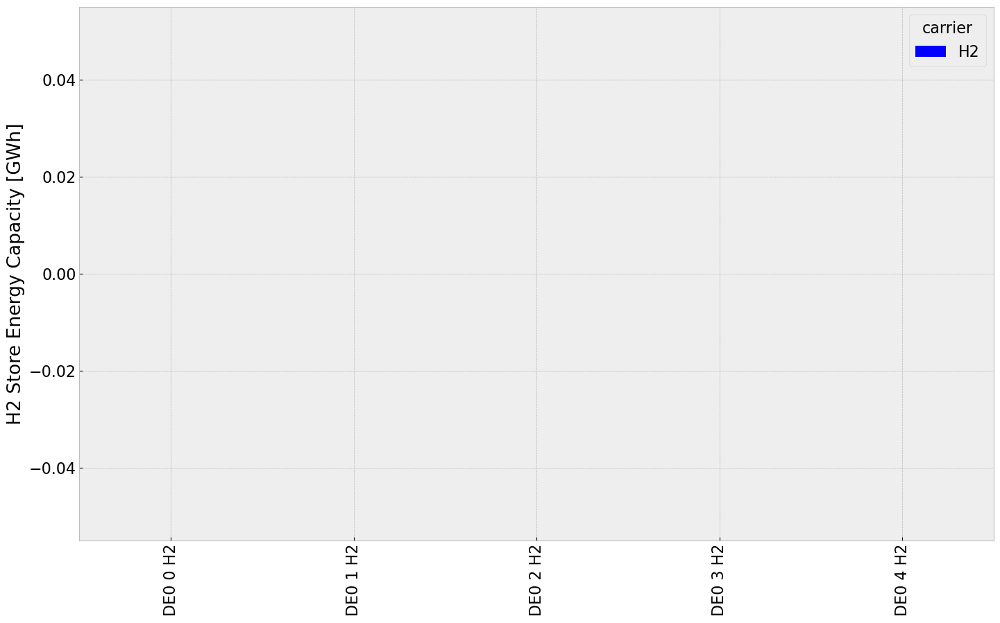

In [30]:
def inst_storeh2_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["blue"],
                                grid=True,
                                xlabel="",
                                ylabel="H2 Store Energy Capacity [GWh]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                #ylim=[0,7500]
    )

    return n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

inst_storeh2_table(n)

In [31]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,build_year,e_nom_opt,type,e_nom,e_nom_mod,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,standing_loss,lifetime
Store,,,,,,,,,,,,,,,,,,,,,,,,
DE0 0 H2,DE0 0 H2,H2,True,True,148.31893,0.010771,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 1 H2,DE0 1 H2,H2,True,True,148.31893,0.010254,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 2 H2,DE0 2 H2,H2,True,True,148.31893,0.010447,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 3 H2,DE0 3 H2,H2,True,True,148.31893,0.009032,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 4 H2,DE0 4 H2,H2,True,True,148.31893,0.010189,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf


In [32]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


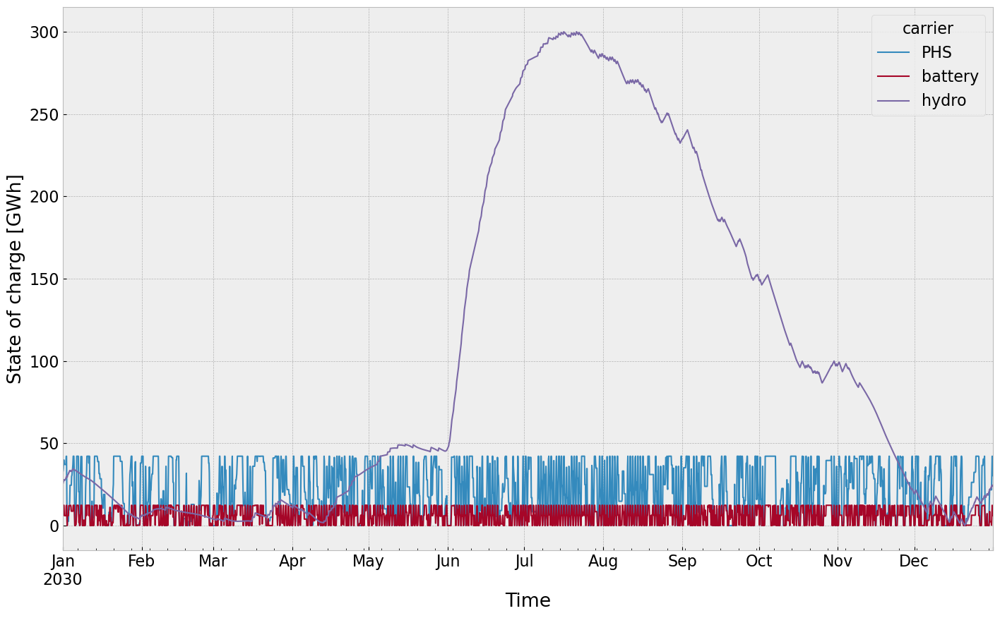

In [33]:
state_of_charge_plot(n)

## Electricity Price

In [34]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [35]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


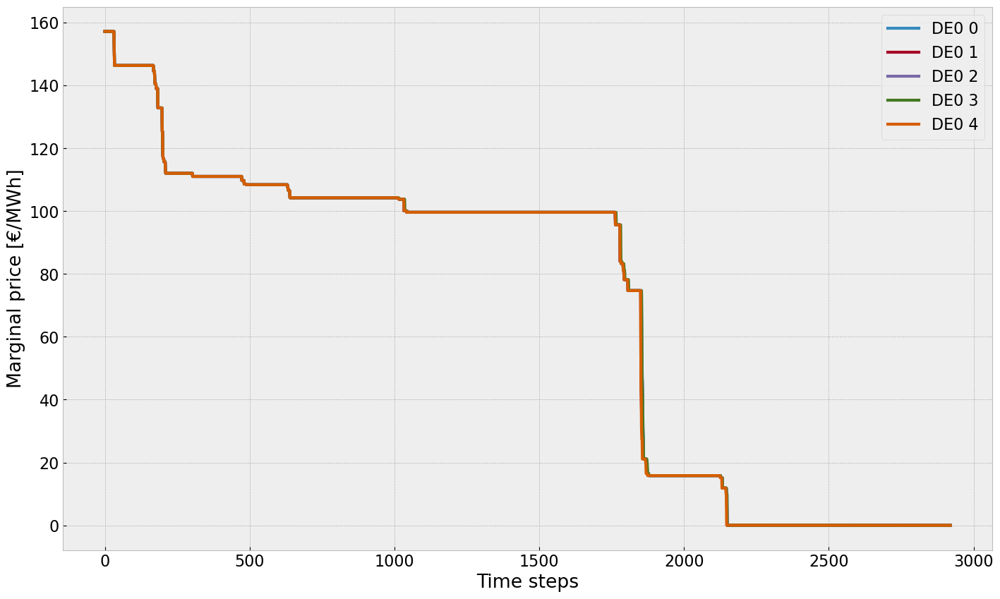

In [36]:
price_dur_curve_plot(n)

In [37]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

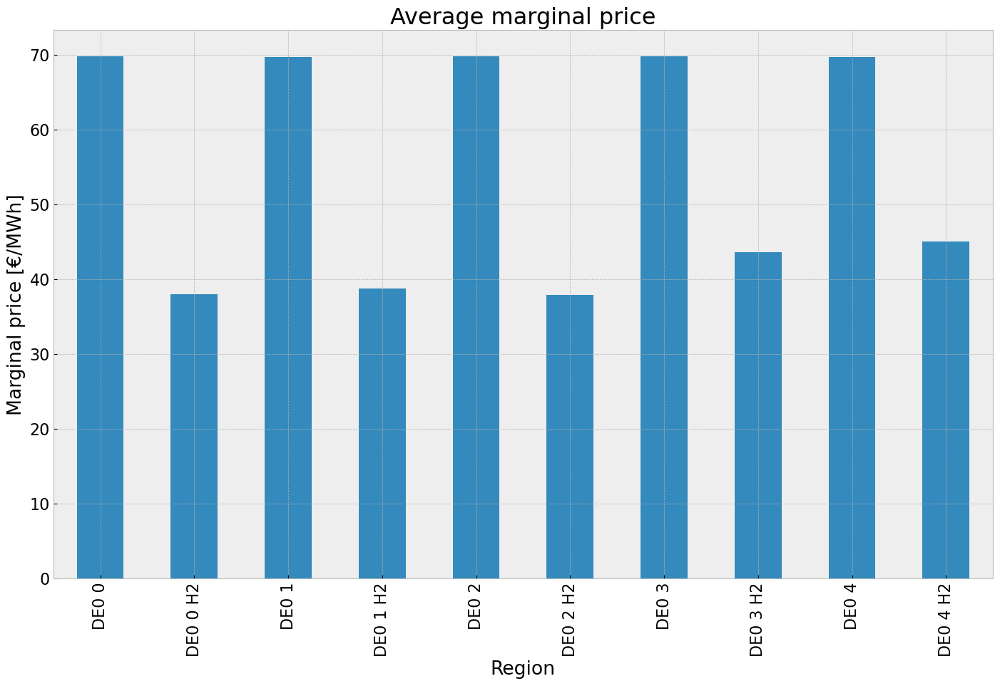

In [38]:
price_regions_table(n)

In [39]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    hprice = mean_p.filter(like='H2')
    eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(16, 8))
    
    # Plot for hprice
    hprice_plot = axs[0].hexbin(
        n.buses.x.filter(like='H2'),  # Assuming n.buses.x and n.buses.y hold the coordinates
        n.buses.y.filter(like='H2'),
        gridsize=20,
        C=hprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[0], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the first subplot
    cb = fig.colorbar(hprice_plot, ax=axs[0], location="bottom")
    cb.set_label("Mean H2 Marginal Price (EUR/MWh) for H2")

    # Plot for eprice
    eprice_plot = axs[1].hexbin(
        n.buses.x[~n.buses.x.index.str.contains('H2')],
        n.buses.y[~n.buses.x.index.str.contains('H2')],
        gridsize=20,
        C=eprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[1], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    cb = fig.colorbar(eprice_plot, ax=axs[1], location="bottom")
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")

    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


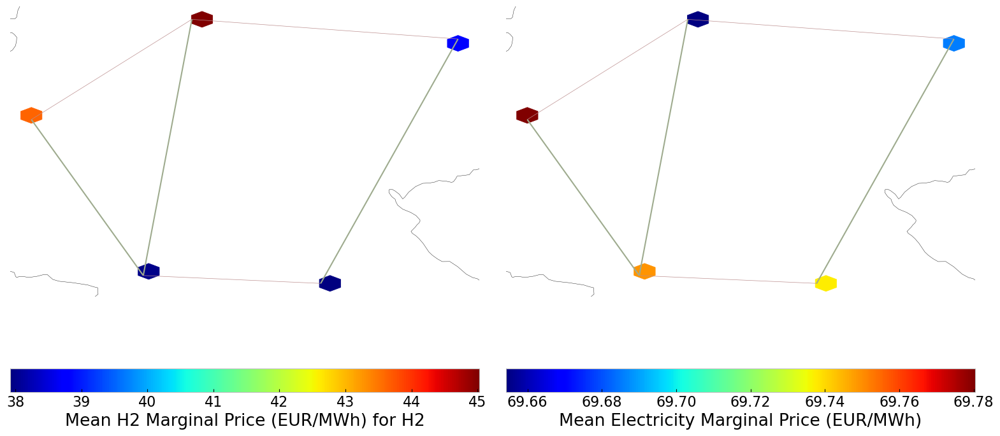

In [40]:
price_regions(n)

## Emission

In [41]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.475453e+07,0.499437,0.1980,1.377831e+07
biomass,1.604494e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.067147e+06,0.358368,0.4069,1.211667e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.633844e+06,1.000000,0.0000,0.000000e+00


# Solar Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [42]:
#copy network
n1=n.copy()

#p_max_pu of pv generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [43]:
n1.optimize.create_model()


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [44]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:02<00:00,  7.13it/s]
INFO:linopy.io: Writing time: 11.65s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k_e8ofdj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k_e8ofdj.lp


Reading time = 3.77 seconds


INFO:gurobipy:Reading time = 3.77 seconds


obj: 849796 rows, 402989 columns, 1558419 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1558419 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1558419 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1558419 nonzeros


Model fingerprint: 0xdc9ae562


INFO:gurobipy:Model fingerprint: 0xdc9ae562


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 613745 rows and 109040 columns


INFO:gurobipy:Presolve removed 613745 rows and 109040 columns


Presolve time: 1.89s


INFO:gurobipy:Presolve time: 1.89s


Presolved: 236051 rows, 293949 columns, 853629 nonzeros


INFO:gurobipy:Presolved: 236051 rows, 293949 columns, 853629 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.78s


INFO:gurobipy:Ordering time: 0.78s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 45


INFO:gurobipy: Dense cols : 45


 AA' NZ     : 8.138e+05


INFO:gurobipy: AA' NZ     : 8.138e+05


 Factor NZ  : 4.465e+06 (roughly 250 MB of memory)


INFO:gurobipy: Factor NZ  : 4.465e+06 (roughly 250 MB of memory)


 Factor Ops : 3.152e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.152e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.35228133e+17 -1.63013384e+18  4.52e+09 5.33e+04  4.64e+13     5s


INFO:gurobipy:   0   1.35228133e+17 -1.63013384e+18  4.52e+09 5.33e+04  4.64e+13     5s


   1   1.24907012e+17 -5.71183874e+17  3.97e+09 1.63e+04  2.79e+13     5s


INFO:gurobipy:   1   1.24907012e+17 -5.71183874e+17  3.97e+09 1.63e+04  2.79e+13     5s


   2   1.08188933e+17 -3.83787256e+17  3.06e+09 9.30e+03  2.03e+13     6s


INFO:gurobipy:   2   1.08188933e+17 -3.83787256e+17  3.06e+09 9.30e+03  2.03e+13     6s


   3   8.11708224e+16 -1.42413681e+17  1.20e+09 1.67e+03  7.83e+12     7s


INFO:gurobipy:   3   8.11708224e+16 -1.42413681e+17  1.20e+09 1.67e+03  7.83e+12     7s


   4   4.20588467e+16 -2.31403811e+16  2.14e+08 2.82e+02  1.44e+12     7s


INFO:gurobipy:   4   4.20588467e+16 -2.31403811e+16  2.14e+08 2.82e+02  1.44e+12     7s


   5   8.35168708e+15 -2.30019412e+15  8.15e+06 2.87e+01  7.38e+10     8s


INFO:gurobipy:   5   8.35168708e+15 -2.30019412e+15  8.15e+06 2.87e+01  7.38e+10     8s


   6   1.43720018e+15 -3.55334093e+14  3.92e+05 3.37e+00  5.78e+09     9s


INFO:gurobipy:   6   1.43720018e+15 -3.55334093e+14  3.92e+05 3.37e+00  5.78e+09     9s


   7   2.70167278e+14 -1.39218373e+14  5.65e+04 9.73e-01  1.06e+09     9s


INFO:gurobipy:   7   2.70167278e+14 -1.39218373e+14  5.65e+04 9.73e-01  1.06e+09     9s


   8   1.74851215e+14 -3.24333049e+13  3.55e+04 5.43e-02  4.97e+08    10s


INFO:gurobipy:   8   1.74851215e+14 -3.24333049e+13  3.55e+04 5.43e-02  4.97e+08    10s


   9   6.53655196e+13 -1.62437386e+13  1.26e+04 2.66e-03  1.80e+08    10s


INFO:gurobipy:   9   6.53655196e+13 -1.62437386e+13  1.26e+04 2.66e-03  1.80e+08    10s


  10   1.00894088e+13 -8.45502039e+12  1.77e+03 5.14e-04  3.51e+07    11s


INFO:gurobipy:  10   1.00894088e+13 -8.45502039e+12  1.77e+03 5.14e-04  3.51e+07    11s


  11   2.01865955e+12 -2.36684459e+12  2.81e+02 8.71e-05  7.52e+06    11s


INFO:gurobipy:  11   2.01865955e+12 -2.36684459e+12  2.81e+02 8.71e-05  7.52e+06    11s


  12   1.00988171e+12 -1.14005322e+12  1.33e+02 3.89e-05  3.61e+06    12s


INFO:gurobipy:  12   1.00988171e+12 -1.14005322e+12  1.33e+02 3.89e-05  3.61e+06    12s


  13   7.46605299e+11 -4.35009944e+11  9.55e+01 1.42e-05  1.96e+06    12s


INFO:gurobipy:  13   7.46605299e+11 -4.35009944e+11  9.55e+01 1.42e-05  1.96e+06    12s


  14   3.58170074e+11 -3.55830957e+11  4.17e+01 1.15e-05  1.17e+06    13s


INFO:gurobipy:  14   3.58170074e+11 -3.55830957e+11  4.17e+01 1.15e-05  1.17e+06    13s


  15   2.28670250e+11 -1.75057092e+11  2.34e+01 6.22e-06  6.60e+05    14s


INFO:gurobipy:  15   2.28670250e+11 -1.75057092e+11  2.34e+01 6.22e-06  6.60e+05    14s


  16   1.32232377e+11 -1.51357136e+11  1.11e+01 5.47e-06  4.62e+05    14s


INFO:gurobipy:  16   1.32232377e+11 -1.51357136e+11  1.11e+01 5.47e-06  4.62e+05    14s


  17   8.92185635e+10 -8.71502254e+10  5.94e+00 3.53e-06  2.87e+05    15s


INFO:gurobipy:  17   8.92185635e+10 -8.71502254e+10  5.94e+00 3.53e-06  2.87e+05    15s


  18   6.75106538e+10 -4.97895146e+10  3.57e+00 2.42e-06  1.91e+05    15s


INFO:gurobipy:  18   6.75106538e+10 -4.97895146e+10  3.57e+00 2.42e-06  1.91e+05    15s


  19   5.82692885e+10 -2.49803126e+10  2.57e+00 1.69e-06  1.35e+05    16s


INFO:gurobipy:  19   5.82692885e+10 -2.49803126e+10  2.57e+00 1.69e-06  1.35e+05    16s


  20   5.40952941e+10 -1.28907972e+10  2.12e+00 1.33e-06  1.09e+05    16s


INFO:gurobipy:  20   5.40952941e+10 -1.28907972e+10  2.12e+00 1.33e-06  1.09e+05    16s


  21   5.15922351e+10  4.70493253e+09  1.86e+00 8.02e-07  7.61e+04    16s


INFO:gurobipy:  21   5.15922351e+10  4.70493253e+09  1.86e+00 8.02e-07  7.61e+04    16s


  22   4.77091880e+10  1.54547270e+10  1.49e+00 4.74e-07  5.23e+04    17s


INFO:gurobipy:  22   4.77091880e+10  1.54547270e+10  1.49e+00 4.74e-07  5.23e+04    17s


  23   4.17269693e+10  1.87077781e+10  9.53e-01 3.69e-07  3.73e+04    18s


INFO:gurobipy:  23   4.17269693e+10  1.87077781e+10  9.53e-01 3.69e-07  3.73e+04    18s


  24   3.86969020e+10  2.15284099e+10  6.87e-01 2.67e-07  2.79e+04    18s


INFO:gurobipy:  24   3.86969020e+10  2.15284099e+10  6.87e-01 2.67e-07  2.79e+04    18s


  25   3.52200861e+10  2.31961885e+10  3.98e-01 2.14e-07  1.95e+04    19s


INFO:gurobipy:  25   3.52200861e+10  2.31961885e+10  3.98e-01 2.14e-07  1.95e+04    19s


  26   3.45489516e+10  2.45745885e+10  3.46e-01 1.70e-07  1.62e+04    19s


INFO:gurobipy:  26   3.45489516e+10  2.45745885e+10  3.46e-01 1.70e-07  1.62e+04    19s


  27   3.43082417e+10  2.57152464e+10  3.27e-01 1.35e-07  1.39e+04    20s


INFO:gurobipy:  27   3.43082417e+10  2.57152464e+10  3.27e-01 1.35e-07  1.39e+04    20s


  28   3.28936034e+10  2.65189111e+10  2.16e-01 1.10e-07  1.03e+04    21s


INFO:gurobipy:  28   3.28936034e+10  2.65189111e+10  2.16e-01 1.10e-07  1.03e+04    21s


  29   3.21202342e+10  2.74616973e+10  1.56e-01 7.92e-08  7.56e+03    21s


INFO:gurobipy:  29   3.21202342e+10  2.74616973e+10  1.56e-01 7.92e-08  7.56e+03    21s


  30   3.14654069e+10  2.80705079e+10  1.05e-01 6.10e-08  5.51e+03    22s


INFO:gurobipy:  30   3.14654069e+10  2.80705079e+10  1.05e-01 6.10e-08  5.51e+03    22s


  31   3.11593128e+10  2.84218731e+10  8.27e-02 5.00e-08  4.44e+03    22s


INFO:gurobipy:  31   3.11593128e+10  2.84218731e+10  8.27e-02 5.00e-08  4.44e+03    22s


  32   3.08161696e+10  2.87301517e+10  5.76e-02 3.99e-08  3.38e+03    23s


INFO:gurobipy:  32   3.08161696e+10  2.87301517e+10  5.76e-02 3.99e-08  3.38e+03    23s


  33   3.06162482e+10  2.89499433e+10  4.36e-02 3.26e-08  2.70e+03    24s


INFO:gurobipy:  33   3.06162482e+10  2.89499433e+10  4.36e-02 3.26e-08  2.70e+03    24s


  34   3.04030263e+10  2.92664682e+10  2.91e-02 2.21e-08  1.84e+03    24s


INFO:gurobipy:  34   3.04030263e+10  2.92664682e+10  2.91e-02 2.21e-08  1.84e+03    24s


  35   3.03025811e+10  2.94300240e+10  2.26e-02 1.66e-08  1.42e+03    25s


INFO:gurobipy:  35   3.03025811e+10  2.94300240e+10  2.26e-02 1.66e-08  1.42e+03    25s


  36   3.02306753e+10  2.95080770e+10  1.81e-02 1.40e-08  1.17e+03    25s


INFO:gurobipy:  36   3.02306753e+10  2.95080770e+10  1.81e-02 1.40e-08  1.17e+03    25s


  37   3.01697347e+10  2.95355068e+10  1.43e-02 1.31e-08  1.03e+03    26s


INFO:gurobipy:  37   3.01697347e+10  2.95355068e+10  1.43e-02 1.31e-08  1.03e+03    26s


  38   3.01328593e+10  2.95933087e+10  1.21e-02 1.12e-08  8.75e+02    26s


INFO:gurobipy:  38   3.01328593e+10  2.95933087e+10  1.21e-02 1.12e-08  8.75e+02    26s


  39   3.00803806e+10  2.96432956e+10  8.81e-03 9.53e-09  7.09e+02    26s


INFO:gurobipy:  39   3.00803806e+10  2.96432956e+10  8.81e-03 9.53e-09  7.09e+02    26s


  40   3.00306438e+10  2.97256752e+10  5.78e-03 6.72e-09  4.95e+02    27s


INFO:gurobipy:  40   3.00306438e+10  2.97256752e+10  5.78e-03 6.72e-09  4.95e+02    27s


  41   2.99983777e+10  2.97772797e+10  3.95e-03 4.98e-09  3.59e+02    27s


INFO:gurobipy:  41   2.99983777e+10  2.97772797e+10  3.95e-03 4.98e-09  3.59e+02    27s


  42   2.99817580e+10  2.98122502e+10  3.03e-03 3.79e-09  2.75e+02    28s


INFO:gurobipy:  42   2.99817580e+10  2.98122502e+10  3.03e-03 3.79e-09  2.75e+02    28s


  43   2.99625798e+10  2.98374007e+10  1.93e-03 2.96e-09  2.03e+02    28s


INFO:gurobipy:  43   2.99625798e+10  2.98374007e+10  1.93e-03 2.96e-09  2.03e+02    28s


  44   2.99514145e+10  2.98674962e+10  1.31e-03 1.95e-09  1.36e+02    29s


INFO:gurobipy:  44   2.99514145e+10  2.98674962e+10  1.31e-03 1.95e-09  1.36e+02    29s


  45   2.99399480e+10  2.98812157e+10  7.19e-04 1.48e-09  9.52e+01    30s


INFO:gurobipy:  45   2.99399480e+10  2.98812157e+10  7.19e-04 1.48e-09  9.52e+01    30s


  46   2.99345678e+10  2.99015473e+10  4.30e-04 7.96e-10  5.36e+01    30s


INFO:gurobipy:  46   2.99345678e+10  2.99015473e+10  4.30e-04 7.96e-10  5.36e+01    30s


  47   2.99323261e+10  2.99130111e+10  3.03e-04 4.12e-10  3.13e+01    31s


INFO:gurobipy:  47   2.99323261e+10  2.99130111e+10  3.03e-04 4.12e-10  3.13e+01    31s


  48   2.99296041e+10  2.99174344e+10  1.71e-04 3.63e-10  1.97e+01    31s


INFO:gurobipy:  48   2.99296041e+10  2.99174344e+10  1.71e-04 3.63e-10  1.97e+01    31s


  49   2.99278523e+10  2.99200247e+10  9.11e-05 9.23e-10  1.27e+01    31s


INFO:gurobipy:  49   2.99278523e+10  2.99200247e+10  9.11e-05 9.23e-10  1.27e+01    31s


  50   2.99272841e+10  2.99223716e+10  6.33e-05 1.72e-10  7.97e+00    32s


INFO:gurobipy:  50   2.99272841e+10  2.99223716e+10  6.33e-05 1.72e-10  7.97e+00    32s


  51   2.99264002e+10  2.99240251e+10  2.89e-05 5.04e-10  3.85e+00    32s


INFO:gurobipy:  51   2.99264002e+10  2.99240251e+10  2.89e-05 5.04e-10  3.85e+00    32s


  52   2.99260778e+10  2.99250163e+10  1.85e-05 3.50e-10  1.72e+00    32s


INFO:gurobipy:  52   2.99260778e+10  2.99250163e+10  1.85e-05 3.50e-10  1.72e+00    32s


  53   2.99258937e+10  2.99252463e+10  3.55e-05 4.94e-10  1.05e+00    33s


INFO:gurobipy:  53   2.99258937e+10  2.99252463e+10  3.55e-05 4.94e-10  1.05e+00    33s


  54   2.99258224e+10  2.99253681e+10  2.25e-05 5.41e-10  7.37e-01    33s


INFO:gurobipy:  54   2.99258224e+10  2.99253681e+10  2.25e-05 5.41e-10  7.37e-01    33s


  55   2.99257541e+10  2.99254533e+10  1.33e-05 3.81e-10  4.88e-01    33s


INFO:gurobipy:  55   2.99257541e+10  2.99254533e+10  1.33e-05 3.81e-10  4.88e-01    33s


  56   2.99257233e+10  2.99255045e+10  1.35e-05 1.25e-09  3.55e-01    34s


INFO:gurobipy:  56   2.99257233e+10  2.99255045e+10  1.35e-05 1.25e-09  3.55e-01    34s


  57   2.99256922e+10  2.99255369e+10  9.87e-06 4.83e-10  2.52e-01    34s


INFO:gurobipy:  57   2.99256922e+10  2.99255369e+10  9.87e-06 4.83e-10  2.52e-01    34s


  58   2.99256548e+10  2.99255755e+10  5.41e-06 5.53e-10  1.29e-01    34s


INFO:gurobipy:  58   2.99256548e+10  2.99255755e+10  5.41e-06 5.53e-10  1.29e-01    34s


  59   2.99256330e+10  2.99255884e+10  2.58e-06 5.93e-10  7.23e-02    35s


INFO:gurobipy:  59   2.99256330e+10  2.99255884e+10  2.58e-06 5.93e-10  7.23e-02    35s


  60   2.99256263e+10  2.99255990e+10  1.55e-06 6.40e-10  4.43e-02    36s


INFO:gurobipy:  60   2.99256263e+10  2.99255990e+10  1.55e-06 6.40e-10  4.43e-02    36s


  61   2.99256234e+10  2.99256073e+10  1.15e-06 2.99e-10  2.63e-02    36s


INFO:gurobipy:  61   2.99256234e+10  2.99256073e+10  1.15e-06 2.99e-10  2.63e-02    36s


  62   2.99256199e+10  2.99256106e+10  6.64e-07 2.69e-10  1.51e-02    37s


INFO:gurobipy:  62   2.99256199e+10  2.99256106e+10  6.64e-07 2.69e-10  1.51e-02    37s


  63   2.99256182e+10  2.99256128e+10  4.32e-07 2.45e-10  8.70e-03    37s


INFO:gurobipy:  63   2.99256182e+10  2.99256128e+10  4.32e-07 2.45e-10  8.70e-03    37s


  64   2.99256165e+10  2.99256138e+10  2.17e-07 1.34e-10  4.38e-03    38s


INFO:gurobipy:  64   2.99256165e+10  2.99256138e+10  2.17e-07 1.34e-10  4.38e-03    38s


  65   2.99256158e+10  2.99256144e+10  1.28e-07 4.96e-10  2.36e-03    38s


INFO:gurobipy:  65   2.99256158e+10  2.99256144e+10  1.28e-07 4.96e-10  2.36e-03    38s


  66   2.99256153e+10  2.99256146e+10  3.68e-06 4.33e-10  1.11e-03    39s


INFO:gurobipy:  66   2.99256153e+10  2.99256146e+10  3.68e-06 4.33e-10  1.11e-03    39s


  67   2.99256151e+10  2.99256148e+10  2.50e-05 2.67e-09  5.09e-04    39s


INFO:gurobipy:  67   2.99256151e+10  2.99256148e+10  2.50e-05 2.67e-09  5.09e-04    39s


  68   2.99256149e+10  2.99256148e+10  9.69e-06 1.93e-09  2.46e-04    40s


INFO:gurobipy:  68   2.99256149e+10  2.99256148e+10  9.69e-06 1.93e-09  2.46e-04    40s


  69   2.99256148e+10  2.99256148e+10  1.50e-05 8.82e-10  8.33e-05    40s


INFO:gurobipy:  69   2.99256148e+10  2.99256148e+10  1.50e-05 8.82e-10  8.33e-05    40s


  70   2.99256148e+10  2.99256148e+10  8.15e-06 3.92e-09  2.73e-05    40s


INFO:gurobipy:  70   2.99256148e+10  2.99256148e+10  8.15e-06 3.92e-09  2.73e-05    40s


  71   2.99256148e+10  2.99256148e+10  4.06e-06 1.03e-08  3.36e-06    41s


INFO:gurobipy:  71   2.99256148e+10  2.99256148e+10  4.06e-06 1.03e-08  3.36e-06    41s


  72   2.99256148e+10  2.99256148e+10  1.06e-06 8.32e-09  9.14e-07    41s


INFO:gurobipy:  72   2.99256148e+10  2.99256148e+10  1.06e-06 8.32e-09  9.14e-07    41s


  73   2.99256148e+10  2.99256148e+10  4.84e-07 9.71e-09  4.85e-08    42s


INFO:gurobipy:  73   2.99256148e+10  2.99256148e+10  4.84e-07 9.71e-09  4.85e-08    42s


  74   2.99256148e+10  2.99256148e+10  2.22e-10 2.07e-09  5.70e-12    42s


INFO:gurobipy:  74   2.99256148e+10  2.99256148e+10  2.22e-10 2.07e-09  5.70e-12    42s


INFO:gurobipy:


Barrier solved model in 74 iterations and 42.37 seconds (11.47 work units)


INFO:gurobipy:Barrier solved model in 74 iterations and 42.37 seconds (11.47 work units)


Optimal objective 2.99256148e+10


INFO:gurobipy:Optimal objective 2.99256148e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  120147 DPushes remaining with DInf 0.0000000e+00                43s


INFO:gurobipy:  120147 DPushes remaining with DInf 0.0000000e+00                43s


       0 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:


    7407 PPushes remaining with PInf 1.4397528e-06                44s


INFO:gurobipy:    7407 PPushes remaining with PInf 1.4397528e-06                44s


       0 PPushes remaining with PInf 0.0000000e+00                45s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                45s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0241989e-09     45s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.0241989e-09     45s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   77293    2.9925615e+10   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:   77293    2.9925615e+10   0.000000e+00   0.000000e+00     46s


INFO:gurobipy:


Solved in 77293 iterations and 45.53 seconds (12.63 work units)


INFO:gurobipy:Solved in 77293 iterations and 45.53 seconds (12.63 work units)


Optimal objective  2.992561480e+10


INFO:gurobipy:Optimal objective  2.992561480e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [45]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

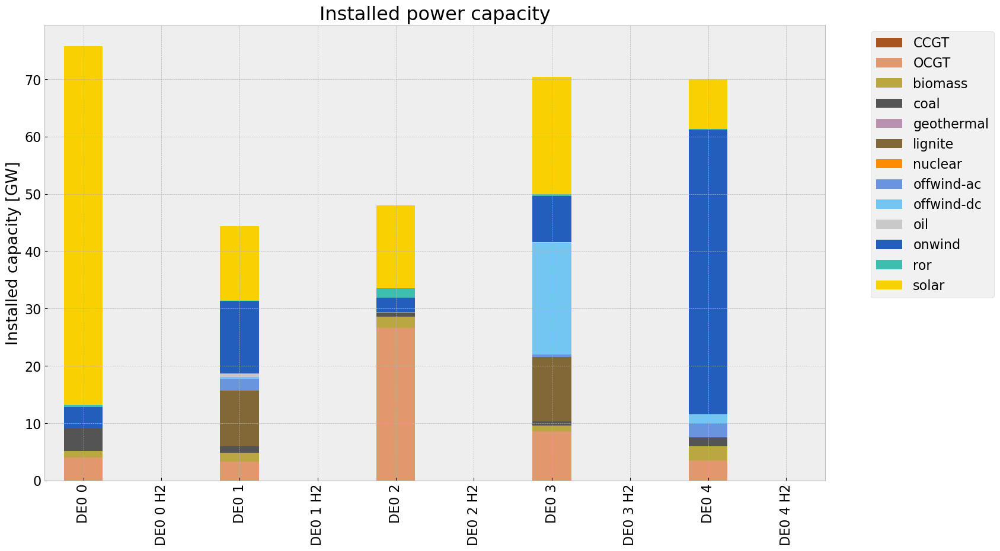

In [46]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

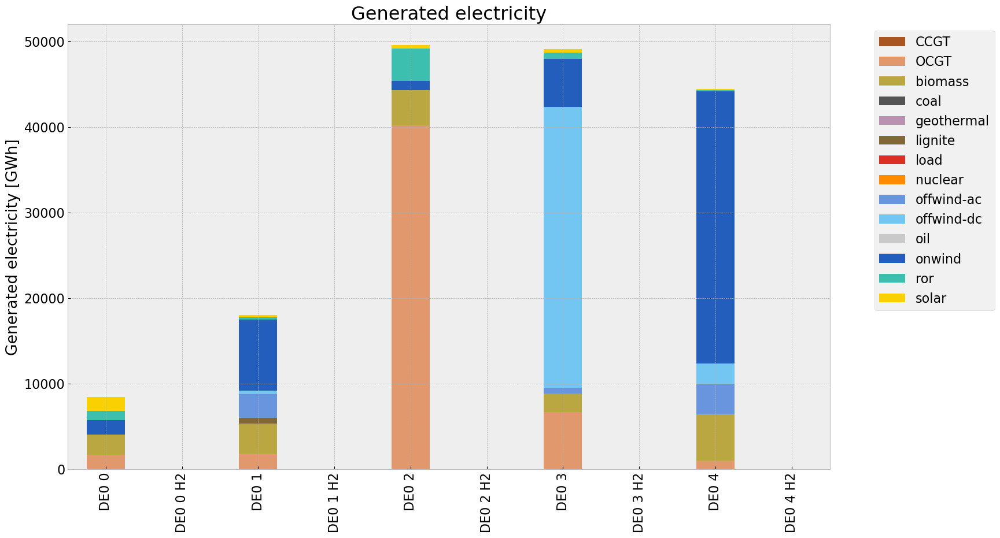

In [47]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

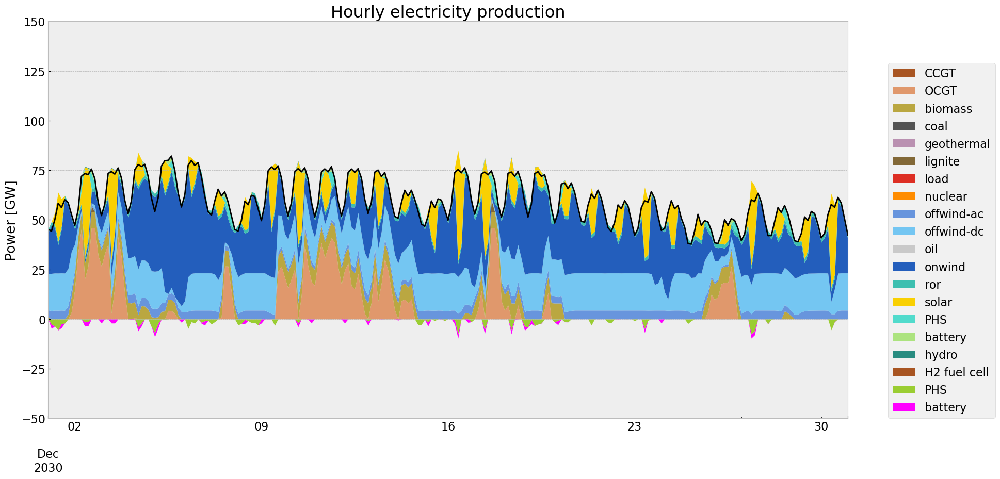

In [48]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

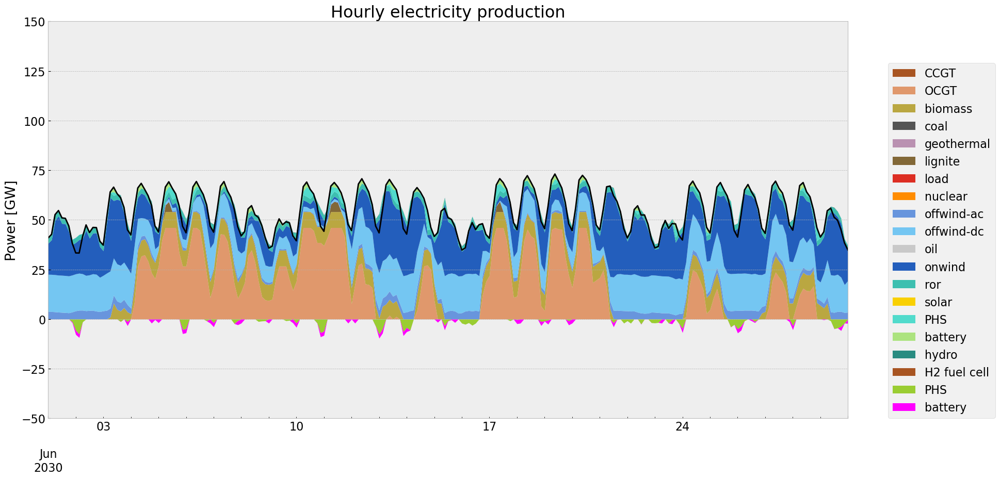

In [49]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen)

## Storage

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,0.000000,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,0.000000,NaN


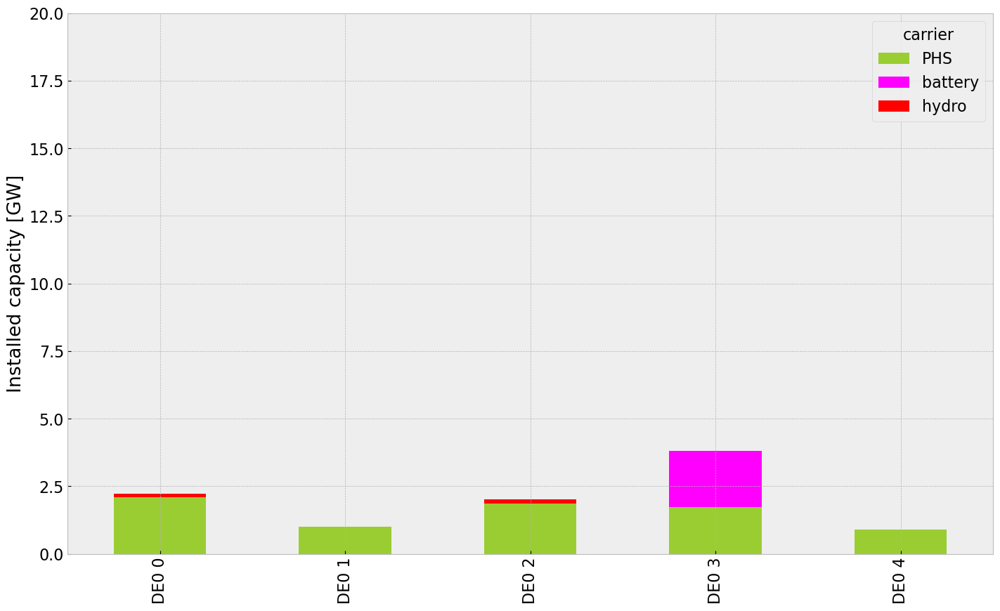

In [50]:
inst_store_table(n1)

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


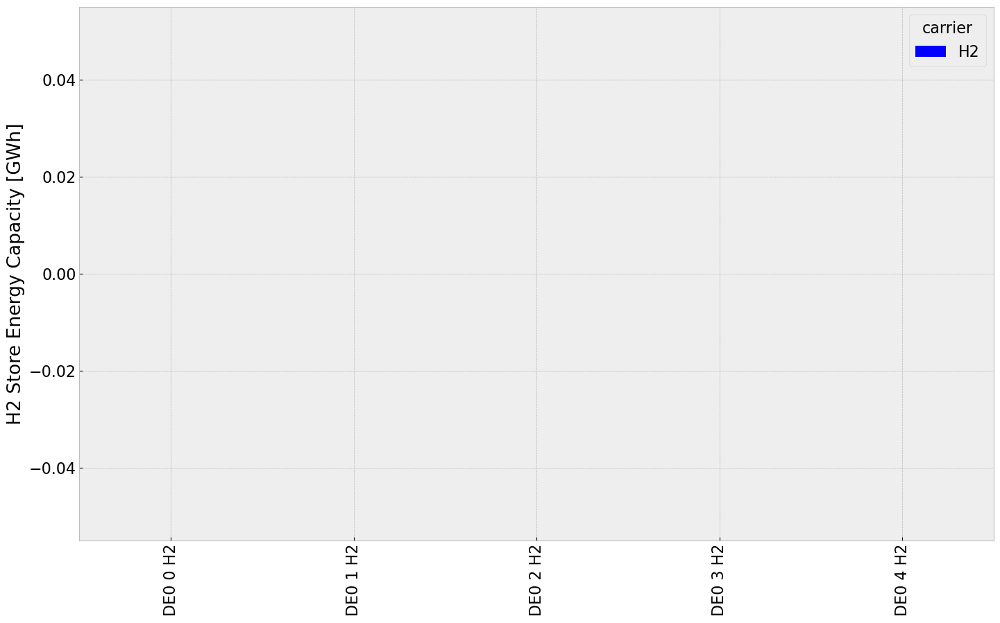

In [51]:
inst_storeh2_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


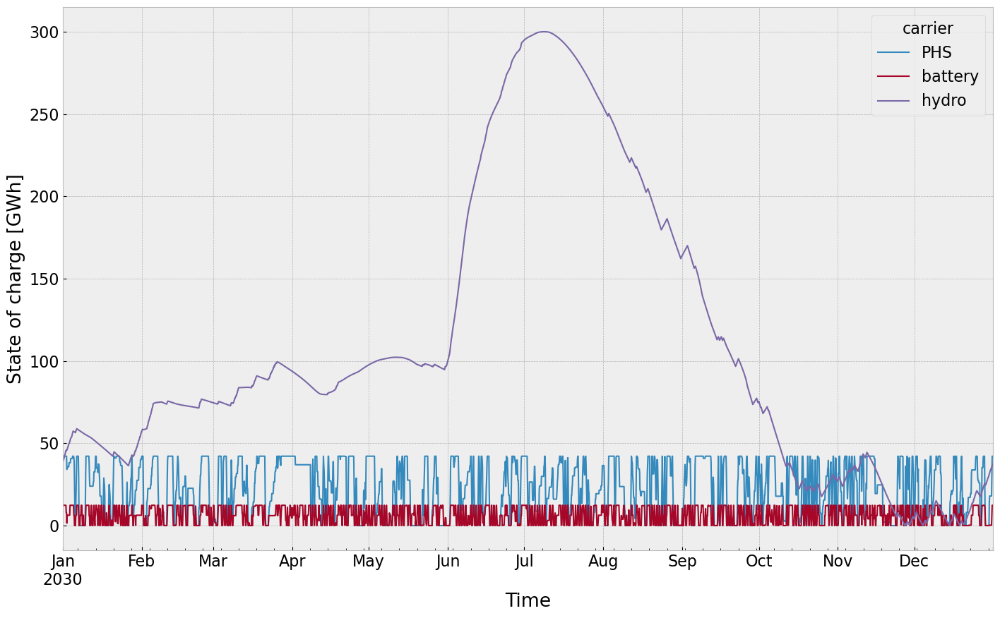

In [52]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


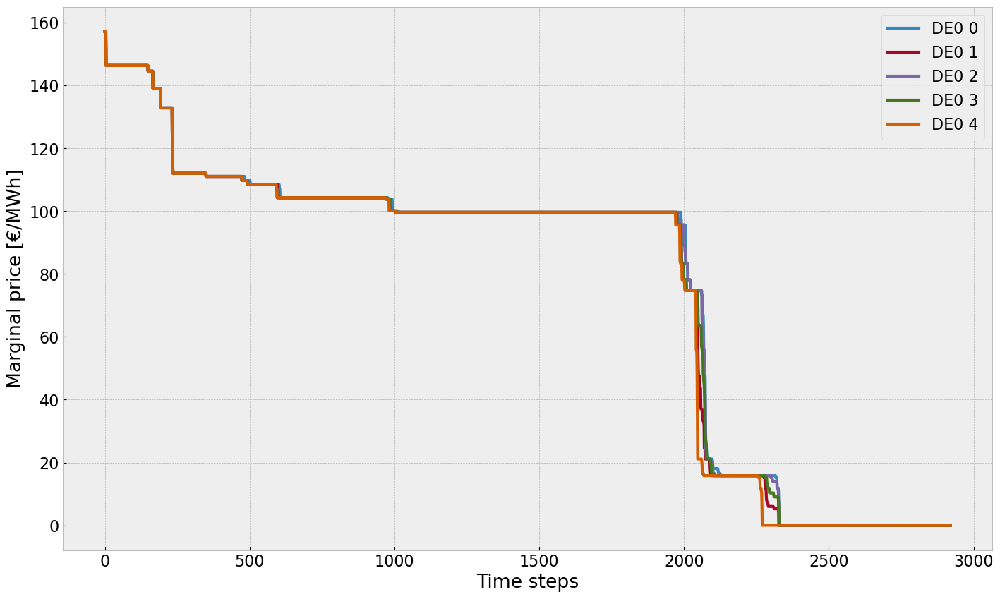

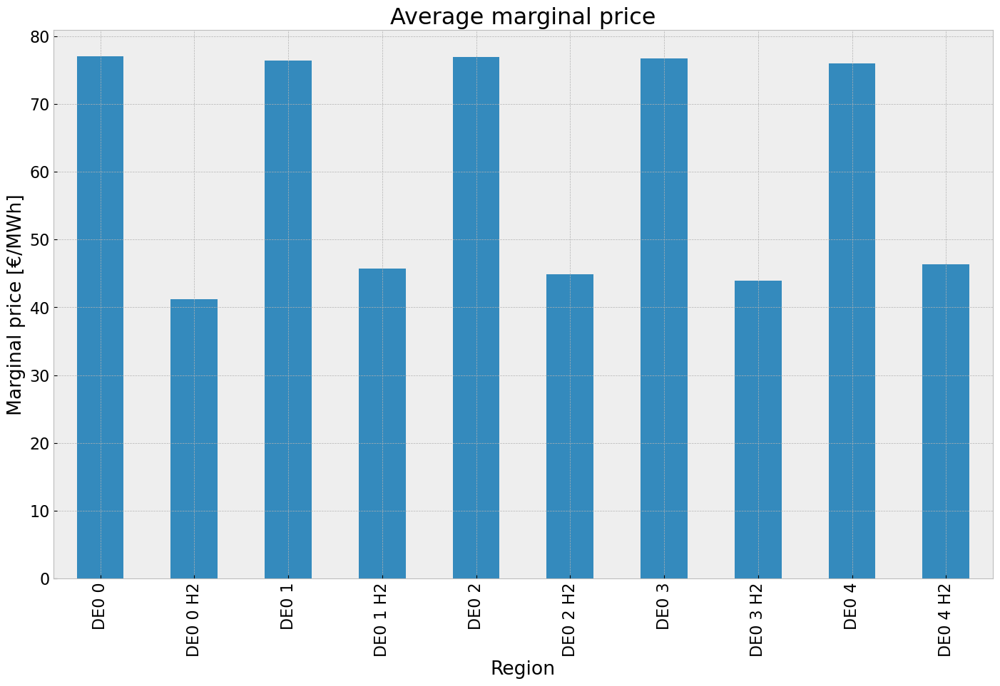

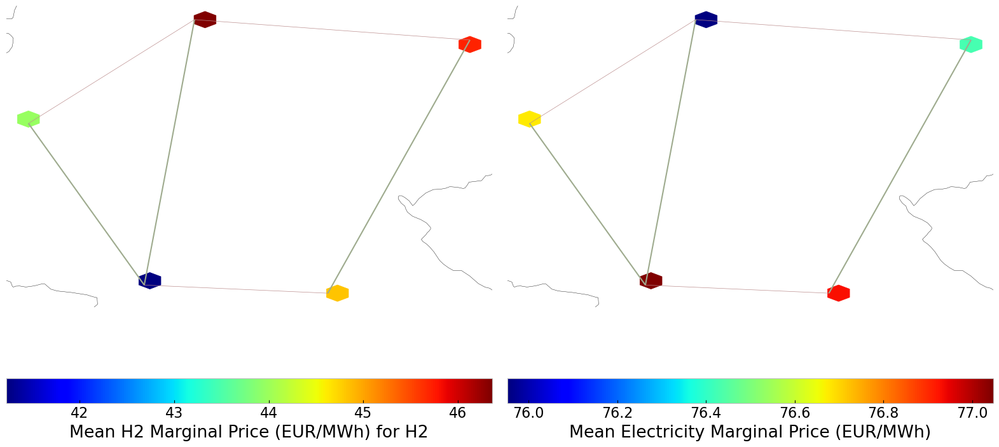

In [53]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [54]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.128102e+07,0.499437,0.1980,2.033018e+07
biomass,1.761582e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,6.451481e+05,0.358368,0.4069,7.325183e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,6.965397e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [55]:
#copy network
n2=n.copy()

#pv cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n1.generators_t.p_max_pu.at[index, column] = 0

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [56]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * Store-fix-e-lower (snapshot, Store-fix)
 * Store-fix-e-upper (snapshot, Store-fix)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUni

In [57]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 10/10 [00:02<00:00,  3.87it/s]
INFO:linopy.io: Writing time: 15.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lxgql0qh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lxgql0qh.lp


Reading time = 3.73 seconds


INFO:gurobipy:Reading time = 3.73 seconds


obj: 849737 rows, 402951 columns, 1419117 nonzeros


INFO:gurobipy:obj: 849737 rows, 402951 columns, 1419117 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


INFO:gurobipy:Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


Model fingerprint: 0x7da98c62


INFO:gurobipy:Model fingerprint: 0x7da98c62


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+02]


INFO:gurobipy:  Bounds range     [1e+01, 5e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 759233 rows and 152834 columns


INFO:gurobipy:Presolve removed 759233 rows and 152834 columns


Presolve time: 1.82s


INFO:gurobipy:Presolve time: 1.82s


Presolved: 90504 rows, 250117 columns, 469088 nonzeros


INFO:gurobipy:Presolved: 90504 rows, 250117 columns, 469088 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.13s


INFO:gurobipy:Ordering time: 0.13s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 13


INFO:gurobipy: Dense cols : 13


 AA' NZ     : 2.219e+05


INFO:gurobipy: AA' NZ     : 2.219e+05


 Factor NZ  : 1.498e+06 (roughly 150 MB of memory)


INFO:gurobipy: Factor NZ  : 1.498e+06 (roughly 150 MB of memory)


 Factor Ops : 3.510e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.510e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.00661034e+18 -9.47643577e+18  3.17e+08 5.18e+06  1.65e+14     3s


INFO:gurobipy:   0   2.00661034e+18 -9.47643577e+18  3.17e+08 5.18e+06  1.65e+14     3s


   1   1.06058437e+18 -1.20514262e+18  1.63e+08 8.20e+05  7.15e+13     3s


INFO:gurobipy:   1   1.06058437e+18 -1.20514262e+18  1.63e+08 8.20e+05  7.15e+13     3s


   2   1.02445123e+18 -5.69386106e+17  1.57e+08 3.53e+05  6.66e+13     3s


INFO:gurobipy:   2   1.02445123e+18 -5.69386106e+17  1.57e+08 3.53e+05  6.66e+13     3s


   3   1.75689697e+17 -3.41094673e+17  2.08e+07 1.43e+05  1.01e+13     4s


INFO:gurobipy:   3   1.75689697e+17 -3.41094673e+17  2.08e+07 1.43e+05  1.01e+13     4s


   4   4.12781622e+16 -2.67676294e+16  5.71e+05 2.34e+03  3.71e+11     4s


INFO:gurobipy:   4   4.12781622e+16 -2.67676294e+16  5.71e+05 2.34e+03  3.71e+11     4s


   5   2.74863734e+15 -3.38165800e+15  1.95e+03 2.22e+02  1.32e+10     4s


INFO:gurobipy:   5   2.74863734e+15 -3.38165800e+15  1.95e+03 2.22e+02  1.32e+10     4s


   6   1.72209543e+14 -6.12127060e+14  1.03e+02 3.61e+01  1.59e+09     4s


INFO:gurobipy:   6   1.72209543e+14 -6.12127060e+14  1.03e+02 3.61e+01  1.59e+09     4s


   7   1.28262363e+13 -4.48983336e+13  4.05e+00 2.52e+00  1.13e+08     4s


INFO:gurobipy:   7   1.28262363e+13 -4.48983336e+13  4.05e+00 2.52e+00  1.13e+08     4s


   8   1.16776926e+13 -3.29430506e+13  3.70e+00 1.83e+00  8.76e+07     5s


INFO:gurobipy:   8   1.16776926e+13 -3.29430506e+13  3.70e+00 1.83e+00  8.76e+07     5s


   9   9.26433244e+12 -1.41007366e+13  2.95e+00 7.25e-01  4.57e+07     5s


INFO:gurobipy:   9   9.26433244e+12 -1.41007366e+13  2.95e+00 7.25e-01  4.57e+07     5s


  10   2.91413140e+12 -3.33763514e+12  8.98e-01 1.33e-01  1.22e+07     6s


INFO:gurobipy:  10   2.91413140e+12 -3.33763514e+12  8.98e-01 1.33e-01  1.22e+07     6s


  11   5.70970926e+11 -8.10303788e+11  1.58e-01 2.77e-02  2.68e+06     6s


INFO:gurobipy:  11   5.70970926e+11 -8.10303788e+11  1.58e-01 2.77e-02  2.68e+06     6s


  12   2.26427444e+11 -4.34425460e+11  5.22e-02 1.51e-02  1.28e+06     6s


INFO:gurobipy:  12   2.26427444e+11 -4.34425460e+11  5.22e-02 1.51e-02  1.28e+06     6s


  13   1.38459374e+11 -2.33982198e+11  2.49e-02 8.18e-03  7.23e+05     6s


INFO:gurobipy:  13   1.38459374e+11 -2.33982198e+11  2.49e-02 8.18e-03  7.23e+05     6s


  14   9.26348890e+10 -1.31809081e+11  1.24e-02 4.62e-03  4.36e+05     6s


INFO:gurobipy:  14   9.26348890e+10 -1.31809081e+11  1.24e-02 4.62e-03  4.36e+05     6s


  15   5.82206725e+10 -7.66105823e+10  4.60e-03 2.79e-03  2.62e+05     7s


INFO:gurobipy:  15   5.82206725e+10 -7.66105823e+10  4.60e-03 2.79e-03  2.62e+05     7s


  16   4.05066659e+10 -2.70958530e+10  2.30e-03 1.39e-03  1.31e+05     7s


INFO:gurobipy:  16   4.05066659e+10 -2.70958530e+10  2.30e-03 1.39e-03  1.31e+05     7s


  17   3.09406812e+10 -7.30416449e+09  1.08e-03 7.82e-04  7.43e+04     7s


INFO:gurobipy:  17   3.09406812e+10 -7.30416449e+09  1.08e-03 7.82e-04  7.43e+04     7s


  18   2.56172779e+10  4.20108076e+09  4.72e-04 4.41e-04  4.16e+04     7s


INFO:gurobipy:  18   2.56172779e+10  4.20108076e+09  4.72e-04 4.41e-04  4.16e+04     7s


  19   2.37145618e+10  1.19724749e+10  2.83e-04 2.30e-04  2.28e+04     8s


INFO:gurobipy:  19   2.37145618e+10  1.19724749e+10  2.83e-04 2.30e-04  2.28e+04     8s


  20   2.23074368e+10  1.49528049e+10  1.61e-04 1.45e-04  1.43e+04     8s


INFO:gurobipy:  20   2.23074368e+10  1.49528049e+10  1.61e-04 1.45e-04  1.43e+04     8s


  21   2.15507977e+10  1.74281512e+10  9.74e-05 7.56e-05  8.01e+03     9s


INFO:gurobipy:  21   2.15507977e+10  1.74281512e+10  9.74e-05 7.56e-05  8.01e+03     9s


  22   2.11242745e+10  1.79418439e+10  6.40e-05 6.18e-05  6.18e+03     9s


INFO:gurobipy:  22   2.11242745e+10  1.79418439e+10  6.40e-05 6.18e-05  6.18e+03     9s


  23   2.07391954e+10  1.90062512e+10  3.55e-05 3.21e-05  3.37e+03     9s


INFO:gurobipy:  23   2.07391954e+10  1.90062512e+10  3.55e-05 3.21e-05  3.37e+03     9s


  24   2.04788951e+10  1.95570345e+10  1.77e-05 1.68e-05  1.79e+03     9s


INFO:gurobipy:  24   2.04788951e+10  1.95570345e+10  1.77e-05 1.68e-05  1.79e+03     9s


  25   2.03210815e+10  1.99173646e+10  7.42e-06 6.73e-06  7.84e+02    10s


INFO:gurobipy:  25   2.03210815e+10  1.99173646e+10  7.42e-06 6.73e-06  7.84e+02    10s


  26   2.02812272e+10  2.00309503e+10  5.07e-06 3.81e-06  4.86e+02    10s


INFO:gurobipy:  26   2.02812272e+10  2.00309503e+10  5.07e-06 3.81e-06  4.86e+02    10s


INFO:gurobipy:


Barrier performed 26 iterations in 9.95 seconds (2.52 work units)


INFO:gurobipy:Barrier performed 26 iterations in 9.95 seconds (2.52 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   55638    2.0187836e+10   0.000000e+00   0.000000e+00     11s


INFO:gurobipy:   55638    2.0187836e+10   0.000000e+00   0.000000e+00     11s


INFO:gurobipy:


Solved in 55638 iterations and 10.56 seconds (4.50 work units)


INFO:gurobipy:Solved in 55638 iterations and 10.56 seconds (4.50 work units)


Optimal objective  2.018783594e+10


INFO:gurobipy:Optimal objective  2.018783594e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402951 primals, 849737 duals
Objective: 2.02e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [58]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

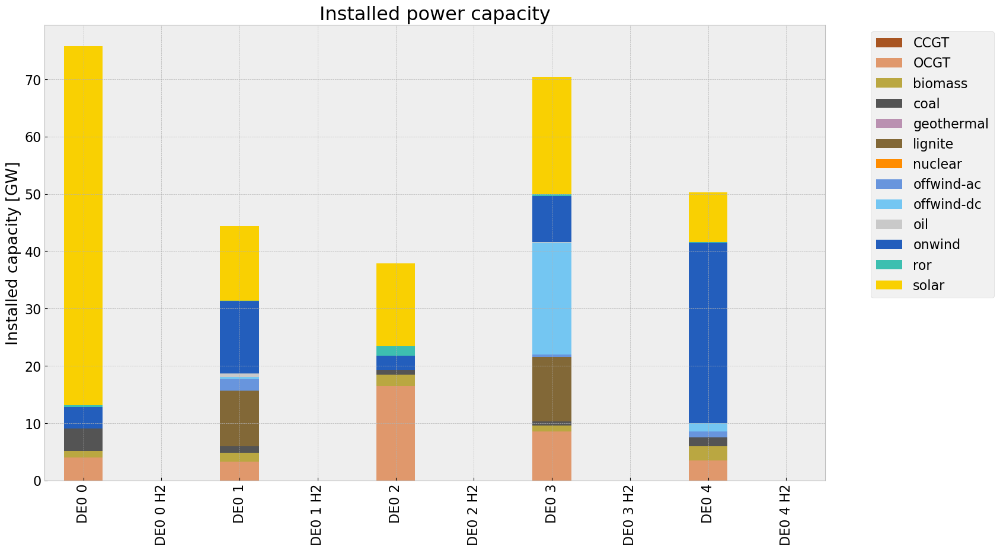

In [59]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

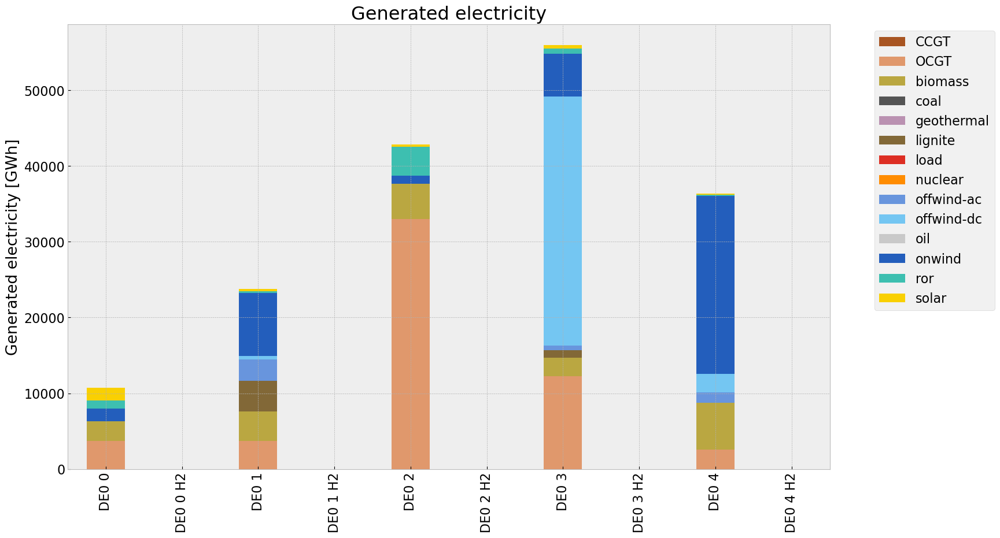

In [60]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2615338355.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2615338355.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, ax

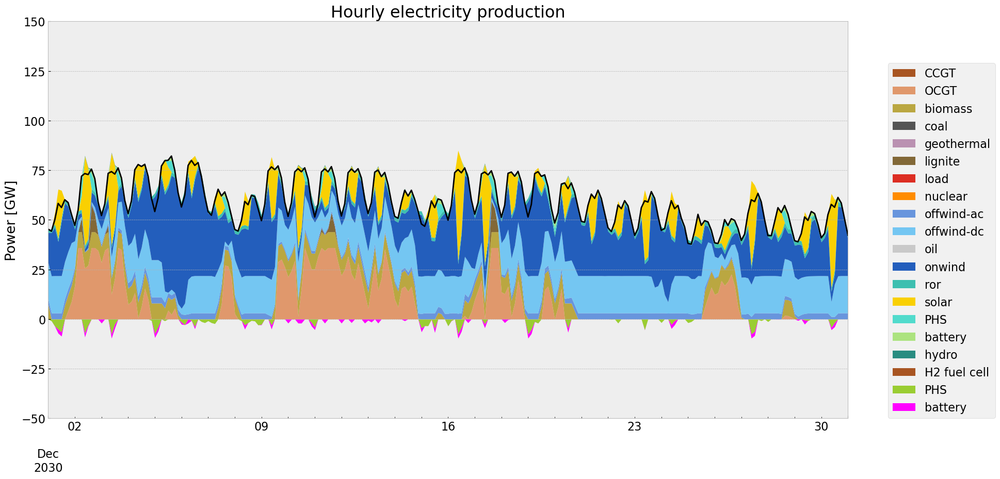

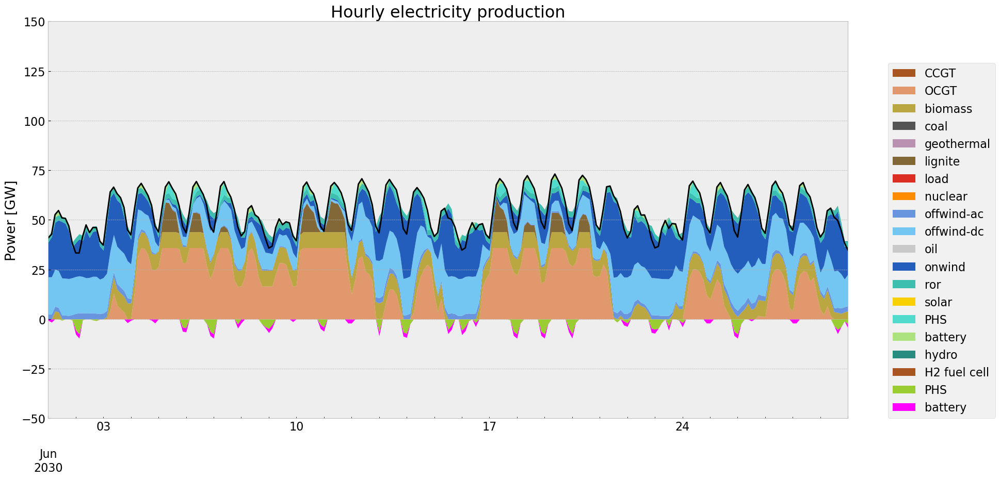

In [61]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2144961626.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2144961626.py:5: FutureWarning: 'H' is deprecated and will be removed in a future ver

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.532214e+07,0.499437,0.1980,2.193227e+07
biomass,1.970616e+07,0.468000,0.0000,0.000000e+00
coal,3.749390e+02,0.329632,0.3361,3.822958e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,4.988935e+06,0.358368,0.4069,5.664569e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.833799e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


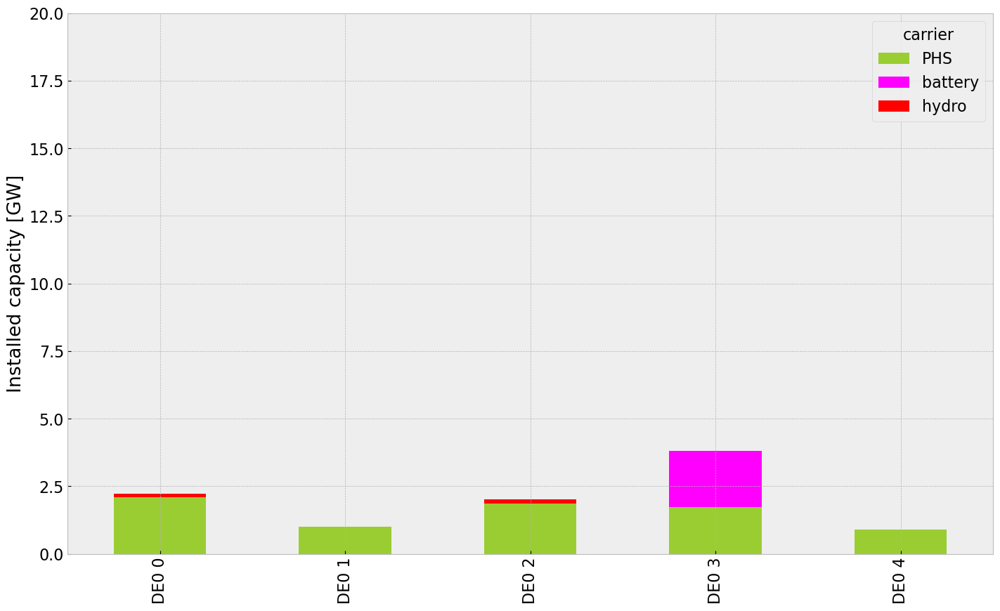

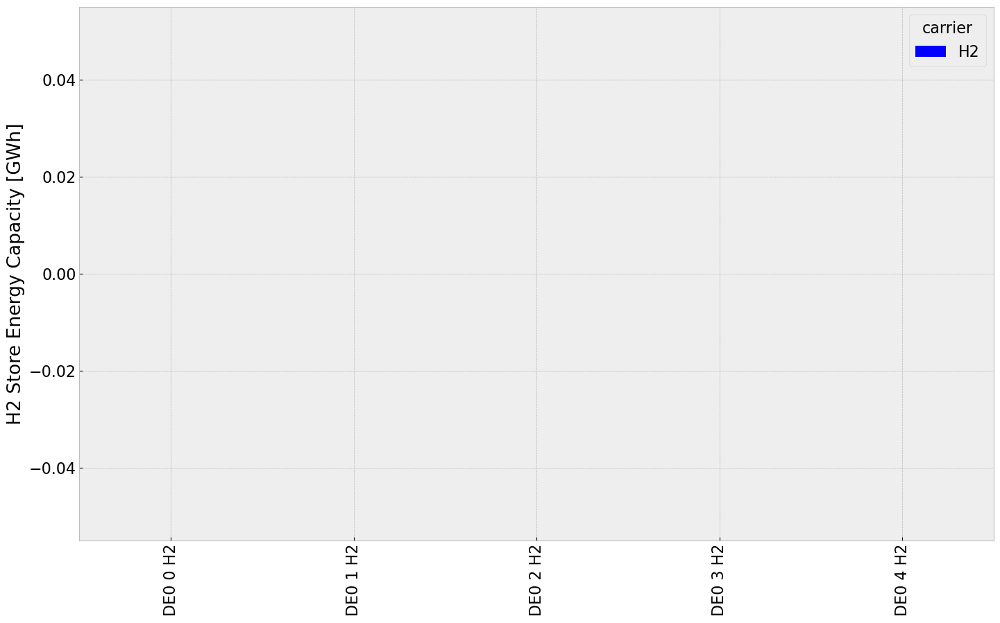

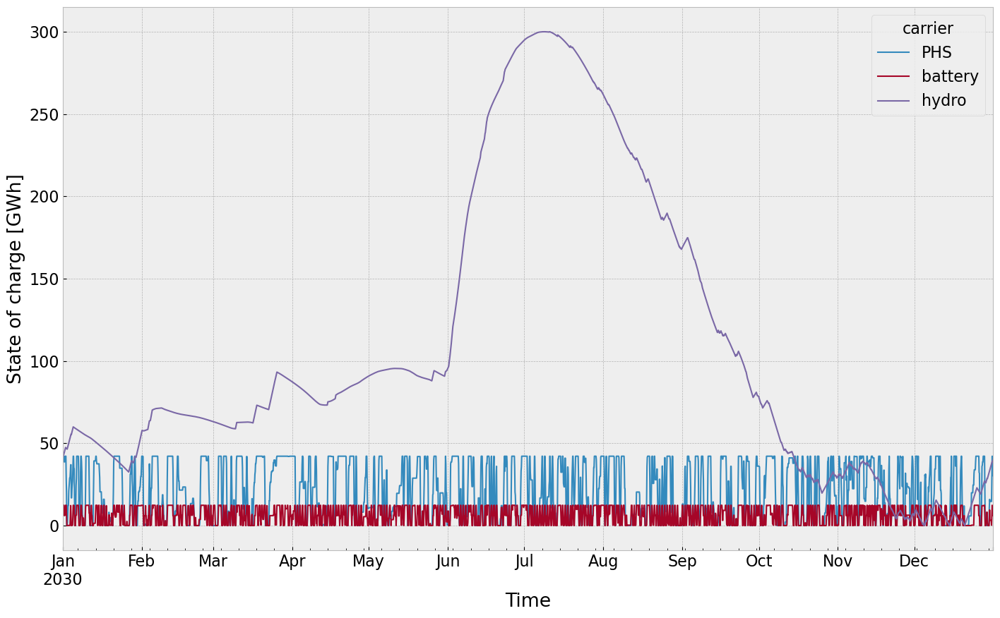

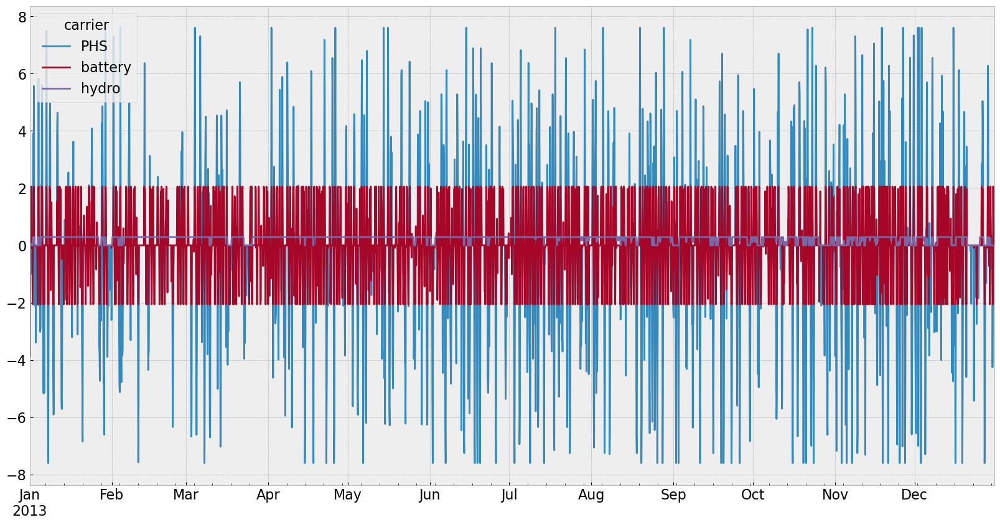

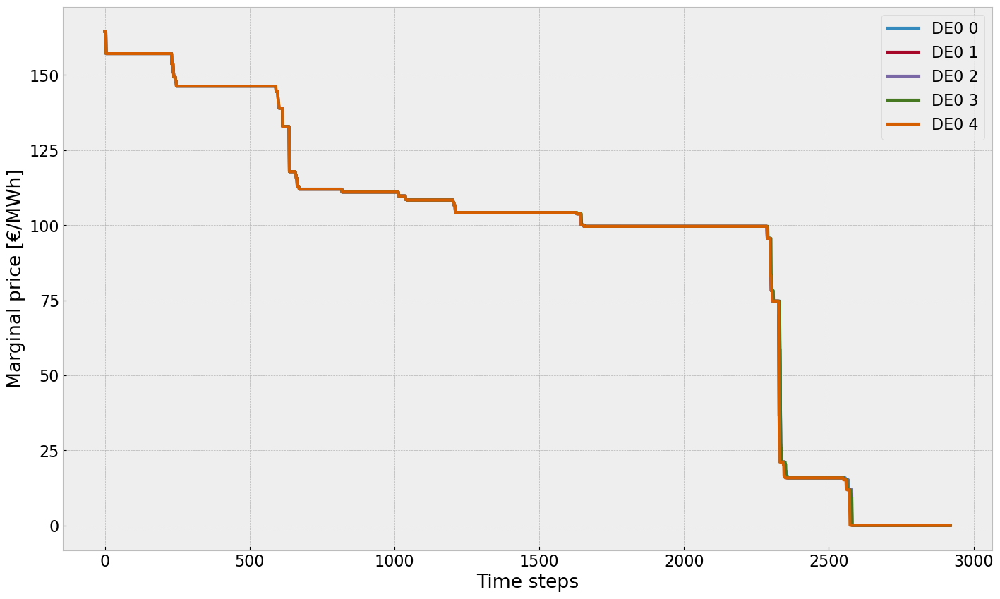

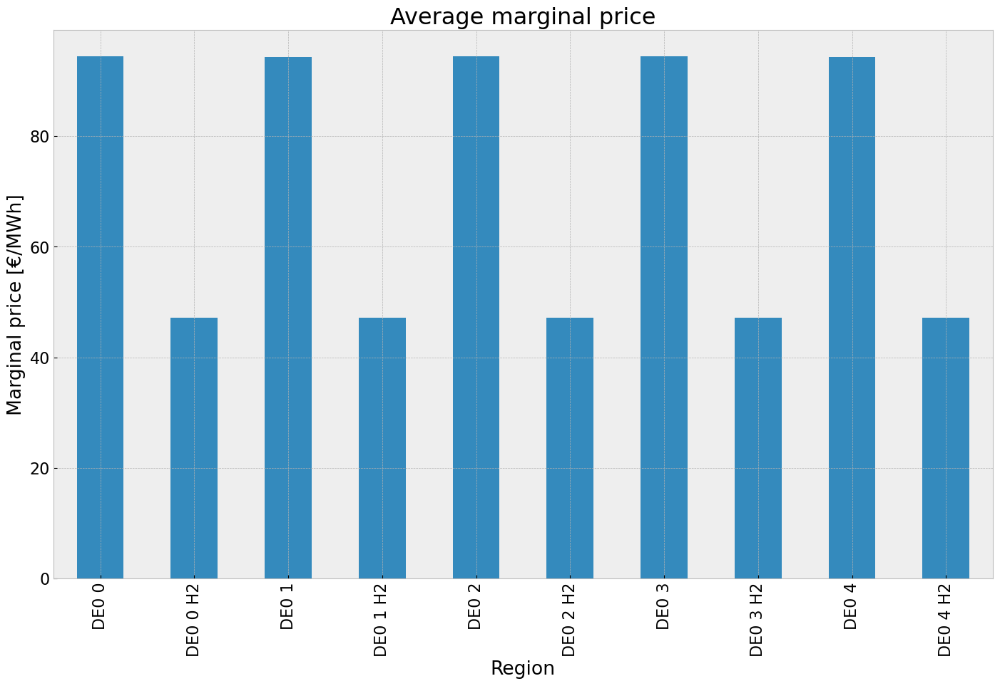

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


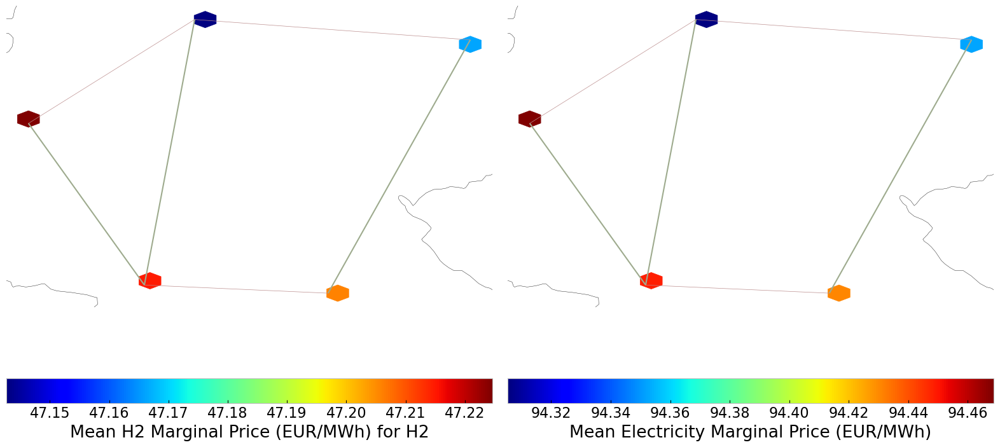

In [62]:
#storage unit & stores
inst_store_table(n2)
inst_storeh2_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [63]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-184yqfqb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-184yqfqb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x857c1586


INFO:gurobipy:Model fingerprint: 0x857c1586


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     412    1.4228220e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     412    1.4228220e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 412 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 412 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.422822039e+06


INFO:gurobipy:Optimal objective  1.422822039e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.42e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5viqsh2n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5viqsh2n.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xace37f89


INFO:gurobipy:Model fingerprint: 0xace37f89


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     420    4.7793240e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     420    4.7793240e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 420 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 420 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.779323980e+07


INFO:gurobipy:Optimal objective  4.779323980e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.78e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h2pdhex6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h2pdhex6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x83bb022c


INFO:gurobipy:Model fingerprint: 0x83bb022c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    2.5041266e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    2.5041266e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.504126600e+08


INFO:gurobipy:Optimal objective  2.504126600e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l2tia6y2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l2tia6y2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x91f66c6e


INFO:gurobipy:Model fingerprint: 0x91f66c6e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     477    2.4509392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     477    2.4509392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 477 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 477 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.450939158e+08


INFO:gurobipy:Optimal objective  2.450939158e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s3ib5xwu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s3ib5xwu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xeae8cac2


INFO:gurobipy:Model fingerprint: 0xeae8cac2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1263 columns


INFO:gurobipy:Presolve removed 6257 rows and 1263 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    3.4654927e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    3.4654927e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.465492746e+08


INFO:gurobipy:Optimal objective  3.465492746e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a74bgthu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a74bgthu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf888ff0a


INFO:gurobipy:Model fingerprint: 0xf888ff0a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    3.2783112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    3.2783112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.278311165e+08


INFO:gurobipy:Optimal objective  3.278311165e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-avmifz59.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-avmifz59.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa291ee62


INFO:gurobipy:Model fingerprint: 0xa291ee62


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    4.9552239e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    4.9552239e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.955223949e+07


INFO:gurobipy:Optimal objective  4.955223949e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.96e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8xc02d9e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8xc02d9e.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xeb52381c


INFO:gurobipy:Model fingerprint: 0xeb52381c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1282 columns


INFO:gurobipy:Presolve removed 6257 rows and 1282 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    3.5175746e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    3.5175746e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.517574568e+08


INFO:gurobipy:Optimal objective  3.517574568e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-46i0g54_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-46i0g54_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3fb5d830


INFO:gurobipy:Model fingerprint: 0x3fb5d830


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1264 columns


INFO:gurobipy:Presolve removed 6257 rows and 1264 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.1743033e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.1743033e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.174303290e+08


INFO:gurobipy:Optimal objective  1.174303290e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ui4tbm7h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ui4tbm7h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc4680873


INFO:gurobipy:Model fingerprint: 0xc4680873


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    1.4069211e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    1.4069211e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.406921120e+07


INFO:gurobipy:Optimal objective  1.406921120e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.41e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rvt5cd_h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rvt5cd_h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4ebdfe58


INFO:gurobipy:Model fingerprint: 0x4ebdfe58


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    5.2814451e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    5.2814451e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.281445051e+07


INFO:gurobipy:Optimal objective  5.281445051e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.28e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2fxxs33_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2fxxs33_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x33fc27c8


INFO:gurobipy:Model fingerprint: 0x33fc27c8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     412    8.0825857e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     412    8.0825857e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 412 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 412 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.082585686e+06


INFO:gurobipy:Optimal objective  8.082585686e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.08e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2ra3paqx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2ra3paqx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x59a536b1


INFO:gurobipy:Model fingerprint: 0x59a536b1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1251 columns


INFO:gurobipy:Presolve removed 6257 rows and 1251 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     420    2.8330270e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     420    2.8330270e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 420 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 420 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.833027040e+08


INFO:gurobipy:Optimal objective  2.833027040e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.83e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-97otffy8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-97otffy8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8aa87980


INFO:gurobipy:Model fingerprint: 0x8aa87980


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1278 columns


INFO:gurobipy:Presolve removed 6257 rows and 1278 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    1.6038826e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    1.6038826e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.603882640e+08


INFO:gurobipy:Optimal objective  1.603882640e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ykgjdqzr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ykgjdqzr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x559e1dc2


INFO:gurobipy:Model fingerprint: 0x559e1dc2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1274 columns


INFO:gurobipy:Presolve removed 6257 rows and 1274 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    2.7928546e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    2.7928546e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.792854576e+08


INFO:gurobipy:Optimal objective  2.792854576e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f5z9m6ok.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f5z9m6ok.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2f582295


INFO:gurobipy:Model fingerprint: 0x2f582295


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1348 columns


INFO:gurobipy:Presolve removed 6257 rows and 1348 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     512    3.6066707e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     512    3.6066707e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 512 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 512 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.606670683e+08


INFO:gurobipy:Optimal objective  3.606670683e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o74amdu5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o74amdu5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x54f5aca2


INFO:gurobipy:Model fingerprint: 0x54f5aca2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1280 columns


INFO:gurobipy:Presolve removed 6257 rows and 1280 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2045 columns, 3832 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2045 columns, 3832 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    2.2812176e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    2.2812176e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.281217601e+08


INFO:gurobipy:Optimal objective  2.281217601e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nhh1itjz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nhh1itjz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2e705d2a


INFO:gurobipy:Model fingerprint: 0x2e705d2a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     530    1.4958725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     530    1.4958725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 530 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 530 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.495872528e+08


INFO:gurobipy:Optimal objective  1.495872528e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hntrol1k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hntrol1k.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf493b91e


INFO:gurobipy:Model fingerprint: 0xf493b91e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1254 columns


INFO:gurobipy:Presolve removed 6257 rows and 1254 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    1.4738533e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    1.4738533e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.473853287e+08


INFO:gurobipy:Optimal objective  1.473853287e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mlqzedmw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mlqzedmw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3e80717c


INFO:gurobipy:Model fingerprint: 0x3e80717c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1276 columns


INFO:gurobipy:Presolve removed 6257 rows and 1276 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2049 columns, 3836 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2049 columns, 3836 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    3.1574746e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    3.1574746e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.157474634e+08


INFO:gurobipy:Optimal objective  3.157474634e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-38ft6sa6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-38ft6sa6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x96e0e887


INFO:gurobipy:Model fingerprint: 0x96e0e887


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1271 columns


INFO:gurobipy:Presolve removed 6257 rows and 1271 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    1.8394793e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    1.8394793e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.839479327e+08


INFO:gurobipy:Optimal objective  1.839479327e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q69yw49w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q69yw49w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4ccbc65e


INFO:gurobipy:Model fingerprint: 0x4ccbc65e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    1.9233946e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    1.9233946e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.923394607e+08


INFO:gurobipy:Optimal objective  1.923394607e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.92e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n05nrn1s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n05nrn1s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x461b3841


INFO:gurobipy:Model fingerprint: 0x461b3841


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     474    5.3478878e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     474    5.3478878e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 474 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 474 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.347887818e+06


INFO:gurobipy:Optimal objective  5.347887818e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.35e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t_8okgzz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t_8okgzz.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4b61011b


INFO:gurobipy:Model fingerprint: 0x4b61011b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    2.5953337e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    2.5953337e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.595333708e+08


INFO:gurobipy:Optimal objective  2.595333708e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n7q305e0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n7q305e0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x40889a3f


INFO:gurobipy:Model fingerprint: 0x40889a3f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1268 columns


INFO:gurobipy:Presolve removed 6257 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.9570136e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.9570136e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.957013644e+08


INFO:gurobipy:Optimal objective  1.957013644e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fabu216w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fabu216w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0eb7fbb7


INFO:gurobipy:Model fingerprint: 0x0eb7fbb7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1252 columns


INFO:gurobipy:Presolve removed 6257 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     403    7.1949435e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     403    7.1949435e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 403 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 403 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.194943489e+07


INFO:gurobipy:Optimal objective  7.194943489e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u44j1i9r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u44j1i9r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x401083fe


INFO:gurobipy:Model fingerprint: 0x401083fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1252 columns


INFO:gurobipy:Presolve removed 6257 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    2.0280897e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    2.0280897e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.028089728e+08


INFO:gurobipy:Optimal objective  2.028089728e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4folu1ba.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4folu1ba.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf1bf1f9a


INFO:gurobipy:Model fingerprint: 0xf1bf1f9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     512    9.8005936e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     512    9.8005936e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 512 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 512 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.800593631e+04


INFO:gurobipy:Optimal objective  9.800593631e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.80e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-obvapybo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-obvapybo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9659b4a5


INFO:gurobipy:Model fingerprint: 0x9659b4a5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    9.6286054e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    9.6286054e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.628605358e+07


INFO:gurobipy:Optimal objective  9.628605358e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.63e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-885a9pam.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-885a9pam.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x949f46e3


INFO:gurobipy:Model fingerprint: 0x949f46e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     428    2.0274172e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     428    2.0274172e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 428 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 428 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.027417216e+08


INFO:gurobipy:Optimal objective  2.027417216e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5f4nb3ce.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5f4nb3ce.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x130defd8


INFO:gurobipy:Model fingerprint: 0x130defd8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1256 columns


INFO:gurobipy:Presolve removed 6257 rows and 1256 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2069 columns, 3856 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2069 columns, 3856 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    1.9632660e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    1.9632660e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.963265964e+08


INFO:gurobipy:Optimal objective  1.963265964e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3it0mzp3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3it0mzp3.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe49d8817


INFO:gurobipy:Model fingerprint: 0xe49d8817


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     517    2.1565529e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     517    2.1565529e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 517 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 517 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.156552875e+08


INFO:gurobipy:Optimal objective  2.156552875e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uy_puux6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uy_puux6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5f09ade6


INFO:gurobipy:Model fingerprint: 0x5f09ade6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1261 columns


INFO:gurobipy:Presolve removed 6257 rows and 1261 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2064 columns, 3851 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2064 columns, 3851 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    1.7868749e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    1.7868749e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.786874930e+08


INFO:gurobipy:Optimal objective  1.786874930e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_i_29p45.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_i_29p45.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x26f25cdc


INFO:gurobipy:Model fingerprint: 0x26f25cdc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     502    2.3594346e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     502    2.3594346e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 502 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 502 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.359434625e+08


INFO:gurobipy:Optimal objective  2.359434625e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y38g5g4r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y38g5g4r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0a0e76d8


INFO:gurobipy:Model fingerprint: 0x0a0e76d8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1252 columns


INFO:gurobipy:Presolve removed 6257 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    9.1843289e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    9.1843289e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.184328943e+07


INFO:gurobipy:Optimal objective  9.184328943e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.18e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ekga_cg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ekga_cg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x39c748c2


INFO:gurobipy:Model fingerprint: 0x39c748c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     419    1.1359555e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     419    1.1359555e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 419 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 419 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.135955467e+08


INFO:gurobipy:Optimal objective  1.135955467e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.14e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4pcuvjkw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4pcuvjkw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xefe0912c


INFO:gurobipy:Model fingerprint: 0xefe0912c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1260 columns


INFO:gurobipy:Presolve removed 6257 rows and 1260 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2065 columns, 3852 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2065 columns, 3852 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    1.4616938e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    1.4616938e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.461693803e+08


INFO:gurobipy:Optimal objective  1.461693803e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wxc494y2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wxc494y2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa97ce5e0


INFO:gurobipy:Model fingerprint: 0xa97ce5e0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1267 columns


INFO:gurobipy:Presolve removed 6257 rows and 1267 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     401    1.5271065e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     401    1.5271065e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 401 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 401 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.527106471e+08


INFO:gurobipy:Optimal objective  1.527106471e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2wenyhmo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2wenyhmo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xea48f5e3


INFO:gurobipy:Model fingerprint: 0xea48f5e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1270 columns


INFO:gurobipy:Presolve removed 6257 rows and 1270 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     393    2.5984286e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     393    2.5984286e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 393 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 393 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.598428648e+08


INFO:gurobipy:Optimal objective  2.598428648e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9x_cbsfy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9x_cbsfy.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfcf1376a


INFO:gurobipy:Model fingerprint: 0xfcf1376a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1265 columns


INFO:gurobipy:Presolve removed 6257 rows and 1265 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     428    1.5277654e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     428    1.5277654e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 428 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 428 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.527765426e+08


INFO:gurobipy:Optimal objective  1.527765426e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-an12jxwv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-an12jxwv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x31b4809a


INFO:gurobipy:Model fingerprint: 0x31b4809a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1272 columns


INFO:gurobipy:Presolve removed 6257 rows and 1272 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     369    2.4061609e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     369    2.4061609e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 369 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 369 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.406160894e+08


INFO:gurobipy:Optimal objective  2.406160894e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u_btoe91.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u_btoe91.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc220b0ae


INFO:gurobipy:Model fingerprint: 0xc220b0ae


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1270 columns


INFO:gurobipy:Presolve removed 6257 rows and 1270 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     398    2.0456293e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     398    2.0456293e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 398 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 398 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.045629302e+08


INFO:gurobipy:Optimal objective  2.045629302e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.05e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1pqct0un.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1pqct0un.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x83f411c9


INFO:gurobipy:Model fingerprint: 0x83f411c9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     386    1.9558783e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     386    1.9558783e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 386 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 386 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.955878252e+08


INFO:gurobipy:Optimal objective  1.955878252e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b854s2bv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b854s2bv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x48d39e9d


INFO:gurobipy:Model fingerprint: 0x48d39e9d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    8.0483268e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    8.0483268e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.048326810e+07


INFO:gurobipy:Optimal objective  8.048326810e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.05e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vau0guif.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vau0guif.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1ab67cef


INFO:gurobipy:Model fingerprint: 0x1ab67cef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    1.3213383e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    1.3213383e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.321338343e+08


INFO:gurobipy:Optimal objective  1.321338343e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nsav6mmj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nsav6mmj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2ab00e91


INFO:gurobipy:Model fingerprint: 0x2ab00e91


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1253 columns


INFO:gurobipy:Presolve removed 6257 rows and 1253 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2072 columns, 3859 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2072 columns, 3859 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    2.2701224e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    2.2701224e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.270122437e+08


INFO:gurobipy:Optimal objective  2.270122437e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.27e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yx8_ymni.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yx8_ymni.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa87674f4


INFO:gurobipy:Model fingerprint: 0xa87674f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1270 columns


INFO:gurobipy:Presolve removed 6257 rows and 1270 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    2.0232727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    2.0232727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.023272659e+08


INFO:gurobipy:Optimal objective  2.023272659e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.02e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vdrj5eih.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vdrj5eih.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x19b86441


INFO:gurobipy:Model fingerprint: 0x19b86441


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1272 columns


INFO:gurobipy:Presolve removed 6257 rows and 1272 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    1.9627938e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    1.9627938e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.962793800e+08


INFO:gurobipy:Optimal objective  1.962793800e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jt1_iokj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jt1_iokj.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6479afbc


INFO:gurobipy:Model fingerprint: 0x6479afbc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     443    1.1634474e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     443    1.1634474e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 443 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 443 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.163447380e+08


INFO:gurobipy:Optimal objective  1.163447380e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-000do2dh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-000do2dh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbac0bbcc


INFO:gurobipy:Model fingerprint: 0xbac0bbcc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1277 columns


INFO:gurobipy:Presolve removed 6257 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    2.3750998e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    2.3750998e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.375099805e+08


INFO:gurobipy:Optimal objective  2.375099805e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uxv8z2f7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uxv8z2f7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x83c94cde


INFO:gurobipy:Model fingerprint: 0x83c94cde


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 4e+02]


INFO:gurobipy:  Bounds range     [1e+02, 4e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     404    1.5123289e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     404    1.5123289e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 404 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 404 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.512328890e+06


INFO:gurobipy:Optimal objective  1.512328890e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.51e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2g87x_nw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2g87x_nw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xcfbc1c7f


INFO:gurobipy:Model fingerprint: 0xcfbc1c7f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     405    1.8721319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     405    1.8721319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 405 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 405 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.872131925e+08


INFO:gurobipy:Optimal objective  1.872131925e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.87e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4hcwagzf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4hcwagzf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd5962c24


INFO:gurobipy:Model fingerprint: 0xd5962c24


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1282 columns


INFO:gurobipy:Presolve removed 6257 rows and 1282 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     412    2.3346473e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     412    2.3346473e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 412 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 412 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.334647267e+08


INFO:gurobipy:Optimal objective  2.334647267e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.33e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i5o5gi99.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i5o5gi99.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x17784cee


INFO:gurobipy:Model fingerprint: 0x17784cee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 4e+02]


INFO:gurobipy:  Bounds range     [2e+02, 4e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1275 columns


INFO:gurobipy:Presolve removed 6257 rows and 1275 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     379    2.8615864e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     379    2.8615864e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 379 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 379 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.861586409e+08


INFO:gurobipy:Optimal objective  2.861586409e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.86e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s03v8319.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s03v8319.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc0fdde03


INFO:gurobipy:Model fingerprint: 0xc0fdde03


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     417    1.1040572e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     417    1.1040572e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 417 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 417 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.104057190e+08


INFO:gurobipy:Optimal objective  1.104057190e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-982irnbe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-982irnbe.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x55986afb


INFO:gurobipy:Model fingerprint: 0x55986afb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1262 columns


INFO:gurobipy:Presolve removed 6257 rows and 1262 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     367    1.2267713e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     367    1.2267713e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 367 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 367 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.226771256e+08


INFO:gurobipy:Optimal objective  1.226771256e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.23e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y5wmx_l7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y5wmx_l7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0b4fa113


INFO:gurobipy:Model fingerprint: 0x0b4fa113


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1273 columns


INFO:gurobipy:Presolve removed 6257 rows and 1273 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2052 columns, 3839 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2052 columns, 3839 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     409    2.7372091e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     409    2.7372091e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 409 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 409 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.737209069e+08


INFO:gurobipy:Optimal objective  2.737209069e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-60ybw1j4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-60ybw1j4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe8c7ee24


INFO:gurobipy:Model fingerprint: 0xe8c7ee24


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     444    2.4672892e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     444    2.4672892e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 444 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 444 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.467289150e+07


INFO:gurobipy:Optimal objective  2.467289150e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aivjk6ri.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aivjk6ri.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7b88249c


INFO:gurobipy:Model fingerprint: 0x7b88249c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     486    7.0539857e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     486    7.0539857e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 486 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 486 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.053985657e+07


INFO:gurobipy:Optimal objective  7.053985657e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.05e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w7pll0kj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w7pll0kj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe2ea0a7f


INFO:gurobipy:Model fingerprint: 0xe2ea0a7f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     419    9.5484750e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     419    9.5484750e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 419 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 419 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.548474951e+07


INFO:gurobipy:Optimal objective  9.548474951e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.55e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2nfh_i0r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2nfh_i0r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x58be0ae3


INFO:gurobipy:Model fingerprint: 0x58be0ae3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1263 columns


INFO:gurobipy:Presolve removed 6257 rows and 1263 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     424    1.9602305e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     424    1.9602305e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 424 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 424 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.960230502e+08


INFO:gurobipy:Optimal objective  1.960230502e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_vhyvjoe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_vhyvjoe.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfae98c03


INFO:gurobipy:Model fingerprint: 0xfae98c03


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1268 columns


INFO:gurobipy:Presolve removed 6257 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    2.9087600e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    2.9087600e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.908759986e+08


INFO:gurobipy:Optimal objective  2.908759986e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.91e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rqqx90lx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rqqx90lx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7d730f9b


INFO:gurobipy:Model fingerprint: 0x7d730f9b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1278 columns


INFO:gurobipy:Presolve removed 6257 rows and 1278 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     422    2.4770419e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     422    2.4770419e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 422 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 422 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.477041910e+08


INFO:gurobipy:Optimal objective  2.477041910e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-08y9v871.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-08y9v871.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa7022e5d


INFO:gurobipy:Model fingerprint: 0xa7022e5d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     487    2.0958051e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     487    2.0958051e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 487 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 487 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.095805126e+08


INFO:gurobipy:Optimal objective  2.095805126e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iy3pbn47.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iy3pbn47.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x94dc7cf8


INFO:gurobipy:Model fingerprint: 0x94dc7cf8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1271 columns


INFO:gurobipy:Presolve removed 6257 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    2.1977682e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    2.1977682e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.197768201e+08


INFO:gurobipy:Optimal objective  2.197768201e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4tgxc2p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m4tgxc2p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf38b35f4


INFO:gurobipy:Model fingerprint: 0xf38b35f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1283 columns


INFO:gurobipy:Presolve removed 6257 rows and 1283 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    3.4649731e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    3.4649731e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.464973125e+08


INFO:gurobipy:Optimal objective  3.464973125e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-82lj683g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-82lj683g.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe42b9332


INFO:gurobipy:Model fingerprint: 0xe42b9332


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1254 columns


INFO:gurobipy:Presolve removed 6257 rows and 1254 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.2218317e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.2218317e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.221831739e+08


INFO:gurobipy:Optimal objective  2.221831739e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3woxma69.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3woxma69.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xaef86ee0


INFO:gurobipy:Model fingerprint: 0xaef86ee0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1292 columns


INFO:gurobipy:Presolve removed 6257 rows and 1292 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2033 columns, 3820 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2033 columns, 3820 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    2.7634886e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    2.7634886e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.763488635e+08


INFO:gurobipy:Optimal objective  2.763488635e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fj8tikdg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fj8tikdg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9f93ca5d


INFO:gurobipy:Model fingerprint: 0x9f93ca5d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1327 columns


INFO:gurobipy:Presolve removed 6257 rows and 1327 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    3.6669764e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    3.6669764e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.666976354e+08


INFO:gurobipy:Optimal objective  3.666976354e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.67e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jtp54xue.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jtp54xue.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1e31e8c4


INFO:gurobipy:Model fingerprint: 0x1e31e8c4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1274 columns


INFO:gurobipy:Presolve removed 6257 rows and 1274 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     437    1.9702191e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     437    1.9702191e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 437 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 437 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.970219078e+08


INFO:gurobipy:Optimal objective  1.970219078e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.97e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s8n0nyzs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s8n0nyzs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1735d443


INFO:gurobipy:Model fingerprint: 0x1735d443


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     439    2.0563109e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     439    2.0563109e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 439 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 439 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.056310943e+08


INFO:gurobipy:Optimal objective  2.056310943e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d3n4oqvi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d3n4oqvi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x09018c7b


INFO:gurobipy:Model fingerprint: 0x09018c7b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1277 columns


INFO:gurobipy:Presolve removed 6257 rows and 1277 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    1.8044311e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    1.8044311e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.804431125e+08


INFO:gurobipy:Optimal objective  1.804431125e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.80e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ir4f1diw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ir4f1diw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6bdeb01c


INFO:gurobipy:Model fingerprint: 0x6bdeb01c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1274 columns


INFO:gurobipy:Presolve removed 6257 rows and 1274 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    2.3950342e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    2.3950342e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.395034152e+08


INFO:gurobipy:Optimal objective  2.395034152e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vpm9qyl_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vpm9qyl_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2a1f4889


INFO:gurobipy:Model fingerprint: 0x2a1f4889


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1275 columns


INFO:gurobipy:Presolve removed 6257 rows and 1275 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    2.1172557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    2.1172557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.117255736e+08


INFO:gurobipy:Optimal objective  2.117255736e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.12e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b5j3kjrd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b5j3kjrd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7ba353fa


INFO:gurobipy:Model fingerprint: 0x7ba353fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    8.9434894e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    8.9434894e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.943489434e+07


INFO:gurobipy:Optimal objective  8.943489434e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.94e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pq2zjx1k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pq2zjx1k.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe1141a10


INFO:gurobipy:Model fingerprint: 0xe1141a10


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1283 columns


INFO:gurobipy:Presolve removed 6257 rows and 1283 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     436    1.9350572e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     436    1.9350572e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 436 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 436 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.935057164e+08


INFO:gurobipy:Optimal objective  1.935057164e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tt221rjr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tt221rjr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x391c6743


INFO:gurobipy:Model fingerprint: 0x391c6743


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1265 columns


INFO:gurobipy:Presolve removed 6257 rows and 1265 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.7744673e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.7744673e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.774467325e+08


INFO:gurobipy:Optimal objective  1.774467325e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.77e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g6t_ul7r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g6t_ul7r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9fdba474


INFO:gurobipy:Model fingerprint: 0x9fdba474


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1310 columns


INFO:gurobipy:Presolve removed 6257 rows and 1310 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 744 rows, 2015 columns, 3802 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2015 columns, 3802 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    3.5569005e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    3.5569005e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.08 seconds (0.01 work units)


Optimal objective  3.556900467e+08


INFO:gurobipy:Optimal objective  3.556900467e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9dj09y6v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9dj09y6v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc2b8ef79


INFO:gurobipy:Model fingerprint: 0xc2b8ef79


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    7.4510849e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    7.4510849e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.451084928e+07


INFO:gurobipy:Optimal objective  7.451084928e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.45e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tgev3jhv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tgev3jhv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xde80635c


INFO:gurobipy:Model fingerprint: 0xde80635c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     514    2.7495390e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     514    2.7495390e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 514 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 514 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.749539025e+08


INFO:gurobipy:Optimal objective  2.749539025e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7relbksw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7relbksw.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf9be3152


INFO:gurobipy:Model fingerprint: 0xf9be3152


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1286 columns


INFO:gurobipy:Presolve removed 6257 rows and 1286 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2039 columns, 3826 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2039 columns, 3826 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    2.2038151e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    2.2038151e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.203815132e+08


INFO:gurobipy:Optimal objective  2.203815132e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uj1zpwcr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uj1zpwcr.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3577adf2


INFO:gurobipy:Model fingerprint: 0x3577adf2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1258 columns


INFO:gurobipy:Presolve removed 6257 rows and 1258 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2067 columns, 3854 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2067 columns, 3854 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     527    9.7243427e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     527    9.7243427e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 527 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 527 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.724342712e+07


INFO:gurobipy:Optimal objective  9.724342712e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.72e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iaw2tx4m.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iaw2tx4m.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8d8be590


INFO:gurobipy:Model fingerprint: 0x8d8be590


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1291 columns


INFO:gurobipy:Presolve removed 6257 rows and 1291 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2034 columns, 3821 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2034 columns, 3821 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     468    2.4904318e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     468    2.4904318e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 468 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 468 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.490431848e+08


INFO:gurobipy:Optimal objective  2.490431848e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-at5r1icu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-at5r1icu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3309 columns, 11667 nonzeros


INFO:gurobipy:obj: 7001 rows, 3309 columns, 11667 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


Model fingerprint: 0x0a6d560a


INFO:gurobipy:Model fingerprint: 0x0a6d560a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 7e+01]


INFO:gurobipy:  Bounds range     [1e+01, 7e+01]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6269 rows and 1330 columns


INFO:gurobipy:Presolve removed 6269 rows and 1330 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 732 rows, 1979 columns, 3754 nonzeros


INFO:gurobipy:Presolved: 732 rows, 1979 columns, 3754 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    2.3995212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    2.3995212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.399521204e+08


INFO:gurobipy:Optimal objective  2.399521204e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3309 primals, 7001 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-arj30yl9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-arj30yl9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0e4d1575


INFO:gurobipy:Model fingerprint: 0x0e4d1575


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1265 columns


INFO:gurobipy:Presolve removed 6257 rows and 1265 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    2.9757025e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    2.9757025e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.975702531e+08


INFO:gurobipy:Optimal objective  2.975702531e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.98e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pufxbu_f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pufxbu_f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe15d4c02


INFO:gurobipy:Model fingerprint: 0xe15d4c02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 9e+01]


INFO:gurobipy:  Bounds range     [6e+01, 9e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    1.7119921e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    1.7119921e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.711992131e+08


INFO:gurobipy:Optimal objective  1.711992131e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.71e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28ktkfzx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28ktkfzx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2cef2481


INFO:gurobipy:Model fingerprint: 0x2cef2481


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    1.5490471e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    1.5490471e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.11 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.11 seconds (0.01 work units)


Optimal objective  1.549047099e+08


INFO:gurobipy:Optimal objective  1.549047099e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6kyz8xks.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6kyz8xks.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf45466b6


INFO:gurobipy:Model fingerprint: 0xf45466b6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1268 columns


INFO:gurobipy:Presolve removed 6257 rows and 1268 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    2.3748323e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    2.3748323e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.374832347e+08


INFO:gurobipy:Optimal objective  2.374832347e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.37e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ncuktd1z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ncuktd1z.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6dd967b7


INFO:gurobipy:Model fingerprint: 0x6dd967b7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1277 columns


INFO:gurobipy:Presolve removed 6257 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    1.6084742e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    1.6084742e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.608474221e+08


INFO:gurobipy:Optimal objective  1.608474221e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cgeoa7lw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cgeoa7lw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3319 columns, 11677 nonzeros


INFO:gurobipy:obj: 7001 rows, 3319 columns, 11677 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


Model fingerprint: 0xa90e953d


INFO:gurobipy:Model fingerprint: 0xa90e953d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 8e+01]


INFO:gurobipy:  Bounds range     [1e+01, 8e+01]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6261 rows and 1291 columns


INFO:gurobipy:Presolve removed 6261 rows and 1291 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 740 rows, 2028 columns, 3811 nonzeros


INFO:gurobipy:Presolved: 740 rows, 2028 columns, 3811 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    3.4085602e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    3.4085602e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.408560249e+08


INFO:gurobipy:Optimal objective  3.408560249e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3319 primals, 7001 duals
Objective: 3.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iuqxii2f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iuqxii2f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8956741a


INFO:gurobipy:Model fingerprint: 0x8956741a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    9.4658975e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    9.4658975e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.465897457e+07


INFO:gurobipy:Optimal objective  9.465897457e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lsu5tfez.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lsu5tfez.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa6465d1e


INFO:gurobipy:Model fingerprint: 0xa6465d1e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     436    6.8793779e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     436    6.8793779e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 436 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 436 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.879377899e+07


INFO:gurobipy:Optimal objective  6.879377899e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.88e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5zlrn0h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5zlrn0h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1264703f


INFO:gurobipy:Model fingerprint: 0x1264703f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1262 columns


INFO:gurobipy:Presolve removed 6257 rows and 1262 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     498    1.5901318e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     498    1.5901318e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 498 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 498 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.590131826e+08


INFO:gurobipy:Optimal objective  1.590131826e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.59e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qixckofh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qixckofh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbcd2c57d


INFO:gurobipy:Model fingerprint: 0xbcd2c57d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1271 columns


INFO:gurobipy:Presolve removed 6257 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    2.5247516e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    2.5247516e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.524751612e+08


INFO:gurobipy:Optimal objective  2.524751612e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x4yq7w1a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x4yq7w1a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf5923c84


INFO:gurobipy:Model fingerprint: 0xf5923c84


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1264 columns


INFO:gurobipy:Presolve removed 6257 rows and 1264 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     516    1.2831855e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     516    1.2831855e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 516 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 516 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.283185503e+08


INFO:gurobipy:Optimal objective  1.283185503e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5vtpzkfd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5vtpzkfd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8705c84d


INFO:gurobipy:Model fingerprint: 0x8705c84d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1251 columns


INFO:gurobipy:Presolve removed 6257 rows and 1251 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     438    1.7462887e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     438    1.7462887e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 438 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 438 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.746288733e+08


INFO:gurobipy:Optimal objective  1.746288733e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qpy6qcw8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qpy6qcw8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8897782f


INFO:gurobipy:Model fingerprint: 0x8897782f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1267 columns


INFO:gurobipy:Presolve removed 6257 rows and 1267 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     439    1.9850558e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     439    1.9850558e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 439 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 439 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.985055815e+08


INFO:gurobipy:Optimal objective  1.985055815e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tmzodxi3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tmzodxi3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x47a8095e


INFO:gurobipy:Model fingerprint: 0x47a8095e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    6.0615054e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    6.0615054e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.06 seconds (0.01 work units)


Optimal objective  6.061505361e+07


INFO:gurobipy:Optimal objective  6.061505361e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.06e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-snngtzjd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-snngtzjd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4a62391b


INFO:gurobipy:Model fingerprint: 0x4a62391b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 9e+01]


INFO:gurobipy:  Bounds range     [4e+01, 9e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     529    7.9320320e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     529    7.9320320e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 529 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 529 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.932032012e+07


INFO:gurobipy:Optimal objective  7.932032012e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-un572dg3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-un572dg3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x15b55451


INFO:gurobipy:Model fingerprint: 0x15b55451


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 7e+01]


INFO:gurobipy:  Bounds range     [5e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    3.8579167e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    3.8579167e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.857916731e+07


INFO:gurobipy:Optimal objective  3.857916731e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.86e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8vf17d9u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8vf17d9u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1e82f282


INFO:gurobipy:Model fingerprint: 0x1e82f282


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     508    2.3180073e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     508    2.3180073e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 508 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 508 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.318007291e+07


INFO:gurobipy:Optimal objective  2.318007291e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.32e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ygxiyzy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ygxiyzy.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4788b532


INFO:gurobipy:Model fingerprint: 0x4788b532


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1223 columns


INFO:gurobipy:Presolve removed 6257 rows and 1223 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2102 columns, 3889 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2102 columns, 3889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    5.8658742e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    5.8658742e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.865874157e+07


INFO:gurobipy:Optimal objective  5.865874157e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.87e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_q1whk1i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_q1whk1i.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1eb35191


INFO:gurobipy:Model fingerprint: 0x1eb35191


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1201 columns


INFO:gurobipy:Presolve removed 6257 rows and 1201 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     490    1.7903116e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     490    1.7903116e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 490 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 490 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.790311581e+07


INFO:gurobipy:Optimal objective  1.790311581e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o6nl3qvi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o6nl3qvi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd8ccb8bc


INFO:gurobipy:Model fingerprint: 0xd8ccb8bc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1203 columns


INFO:gurobipy:Presolve removed 6257 rows and 1203 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    1.0574205e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    1.0574205e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.057420520e+08


INFO:gurobipy:Optimal objective  1.057420520e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rxzgdueh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rxzgdueh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xab5f03a5


INFO:gurobipy:Model fingerprint: 0xab5f03a5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    5.9887183e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    5.9887183e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.988718335e+07


INFO:gurobipy:Optimal objective  5.988718335e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9l87a8ey.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9l87a8ey.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbcc3c075


INFO:gurobipy:Model fingerprint: 0xbcc3c075


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1226 columns


INFO:gurobipy:Presolve removed 6257 rows and 1226 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    1.5285972e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    1.5285972e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.528597158e+08


INFO:gurobipy:Optimal objective  1.528597158e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t86ivx11.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t86ivx11.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbac6ec62


INFO:gurobipy:Model fingerprint: 0xbac6ec62


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1219 columns


INFO:gurobipy:Presolve removed 6257 rows and 1219 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    2.0019238e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    2.0019238e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.001923766e+08


INFO:gurobipy:Optimal objective  2.001923766e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pn7o0gjx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pn7o0gjx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1ff165c0


INFO:gurobipy:Model fingerprint: 0x1ff165c0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1215 columns


INFO:gurobipy:Presolve removed 6257 rows and 1215 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     517    2.5646209e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     517    2.5646209e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 517 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 517 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.564620862e+08


INFO:gurobipy:Optimal objective  2.564620862e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.55s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dngcodu3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dngcodu3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x146b4c6d


INFO:gurobipy:Model fingerprint: 0x146b4c6d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     449    2.1825392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     449    2.1825392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 449 iterations and 0.13 seconds (0.01 work units)


INFO:gurobipy:Solved in 449 iterations and 0.13 seconds (0.01 work units)


Optimal objective  2.182539238e+08


INFO:gurobipy:Optimal objective  2.182539238e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7jev__mx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7jev__mx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5346b20e


INFO:gurobipy:Model fingerprint: 0x5346b20e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1212 columns


INFO:gurobipy:Presolve removed 6257 rows and 1212 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    1.4766347e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    1.4766347e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.476634740e+08


INFO:gurobipy:Optimal objective  1.476634740e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ea0nk5lr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ea0nk5lr.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6b1c4d4b


INFO:gurobipy:Model fingerprint: 0x6b1c4d4b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     514    6.1934933e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     514    6.1934933e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 514 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 514 iterations and 0.05 seconds (0.01 work units)


Optimal objective  6.193493333e+07


INFO:gurobipy:Optimal objective  6.193493333e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q2ri8o9v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q2ri8o9v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbfdfe333


INFO:gurobipy:Model fingerprint: 0xbfdfe333


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     441    1.1794612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     441    1.1794612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 441 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 441 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.179461172e+08


INFO:gurobipy:Optimal objective  1.179461172e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rw5qpz6p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rw5qpz6p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6d78cef8


INFO:gurobipy:Model fingerprint: 0x6d78cef8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1217 columns


INFO:gurobipy:Presolve removed 6257 rows and 1217 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     553    9.8546653e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     553    9.8546653e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 553 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 553 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.854665347e+07


INFO:gurobipy:Optimal objective  9.854665347e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.85e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ef4wofye.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ef4wofye.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x16809ab3


INFO:gurobipy:Model fingerprint: 0x16809ab3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1208 columns


INFO:gurobipy:Presolve removed 6257 rows and 1208 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    2.8313209e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    2.8313209e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.831320891e+07


INFO:gurobipy:Optimal objective  2.831320891e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.83e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tskxgqzx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tskxgqzx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb8f81c86


INFO:gurobipy:Model fingerprint: 0xb8f81c86


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1228 columns


INFO:gurobipy:Presolve removed 6257 rows and 1228 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    1.7898881e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    1.7898881e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.789888085e+08


INFO:gurobipy:Optimal objective  1.789888085e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1_01ohf2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1_01ohf2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdb265631


INFO:gurobipy:Model fingerprint: 0xdb265631


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1218 columns


INFO:gurobipy:Presolve removed 6257 rows and 1218 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    1.4012694e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    1.4012694e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.401269378e+08


INFO:gurobipy:Optimal objective  1.401269378e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ohv6jj9x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ohv6jj9x.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x50b804cd


INFO:gurobipy:Model fingerprint: 0x50b804cd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     474    7.1963458e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     474    7.1963458e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 474 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 474 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.196345757e+07


INFO:gurobipy:Optimal objective  7.196345757e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8ww919fj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8ww919fj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3c3c11e3


INFO:gurobipy:Model fingerprint: 0x3c3c11e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     501    4.7451665e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     501    4.7451665e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 501 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 501 iterations and 0.04 seconds (0.01 work units)


Optimal objective  4.745166511e+07


INFO:gurobipy:Optimal objective  4.745166511e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1slz19u8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1slz19u8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x093c8f90


INFO:gurobipy:Model fingerprint: 0x093c8f90


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     422    9.4762755e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     422    9.4762755e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 422 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 422 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.476275488e+04


INFO:gurobipy:Optimal objective  9.476275488e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.48e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3rjv4m6e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3rjv4m6e.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0c770110


INFO:gurobipy:Model fingerprint: 0x0c770110


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     436    5.2060811e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     436    5.2060811e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 436 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 436 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.206081116e+07


INFO:gurobipy:Optimal objective  5.206081116e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.21e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w5col254.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w5col254.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd96acffd


INFO:gurobipy:Model fingerprint: 0xd96acffd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     404    2.6215282e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     404    2.6215282e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 404 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 404 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.621528207e+06


INFO:gurobipy:Optimal objective  2.621528207e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.62e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n9yd0vas.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n9yd0vas.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4673 rows, 2221 columns, 7795 nonzeros


INFO:gurobipy:obj: 4673 rows, 2221 columns, 7795 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


INFO:gurobipy:Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


Model fingerprint: 0x6017e81b


INFO:gurobipy:Model fingerprint: 0x6017e81b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 4177 rows and 802 columns


INFO:gurobipy:Presolve removed 4177 rows and 802 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     300    5.7057849e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     300    5.7057849e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 300 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 300 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.705784909e+04


INFO:gurobipy:Optimal objective  5.705784909e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2221 primals, 4673 duals
Objective: 5.71e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

PyPSA Network
Components:
 - Bus: 10
 - Carrier: 23
 - Generator: 71
 - GlobalConstraint: 1
 - Line: 6
 - Link: 13
 - Load: 5
 - StorageUnit: 12
 - Store: 5
 - SubNetwork: 1
Snapshots: 2920

In [64]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

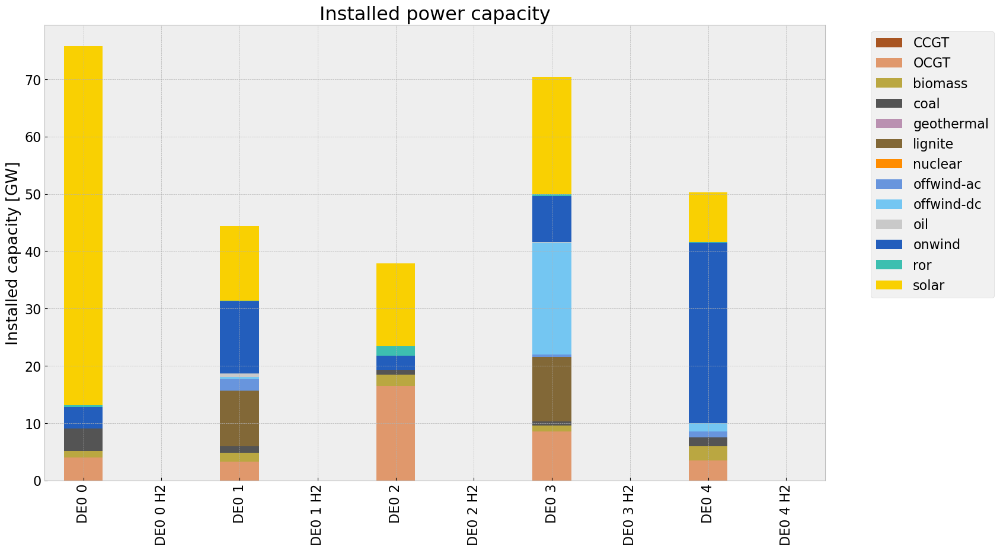

<Figure size 640x480 with 0 Axes>

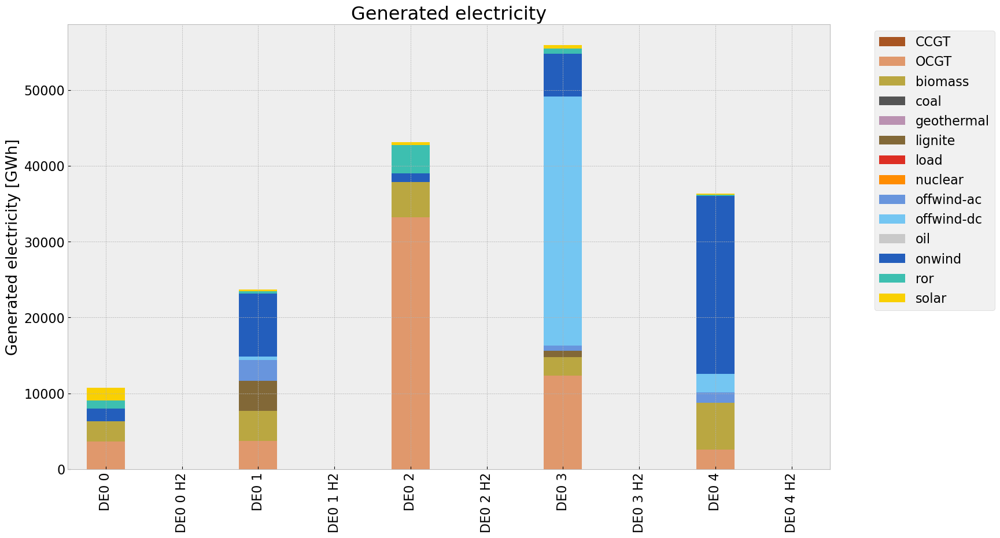

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\1913995090.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\1913995090.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, 

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.548628e+07,0.499437,0.1980,2.199734e+07
biomass,1.983637e+07,0.468000,0.0000,0.000000e+00
coal,3.749390e+02,0.329632,0.3361,3.822958e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,4.834709e+06,0.358368,0.4069,5.489456e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.831968e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


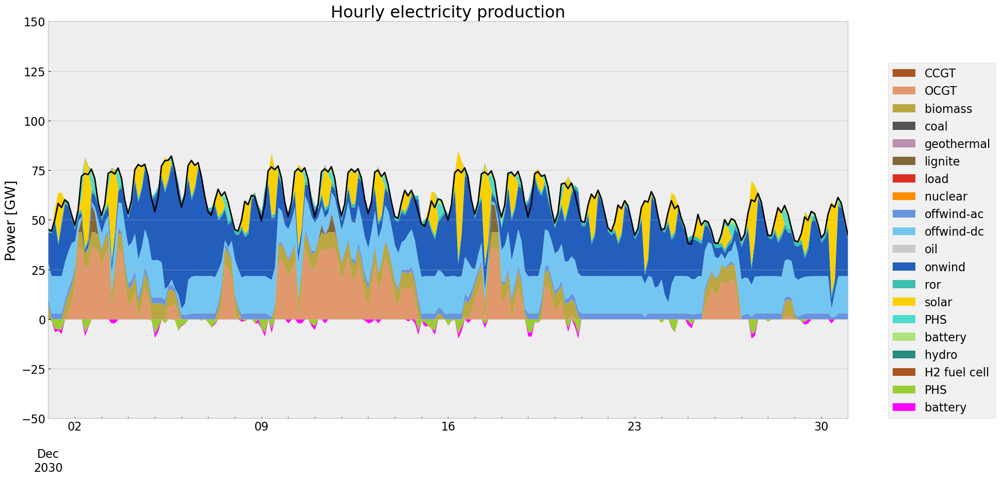

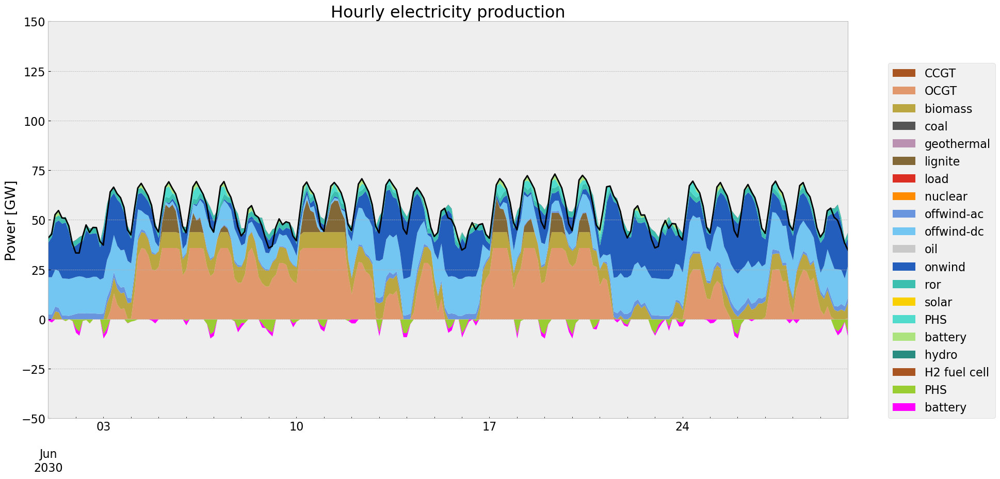

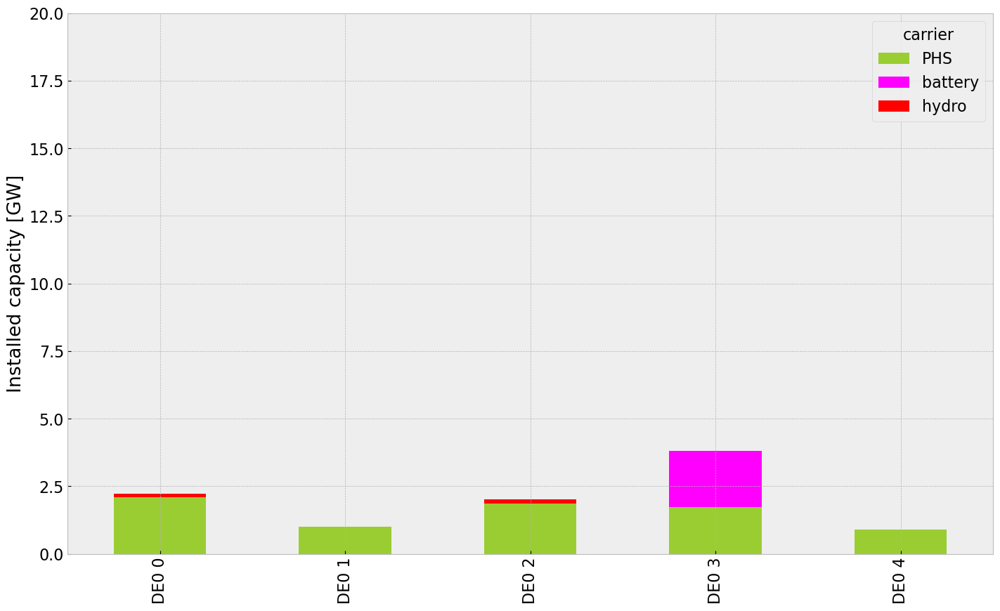

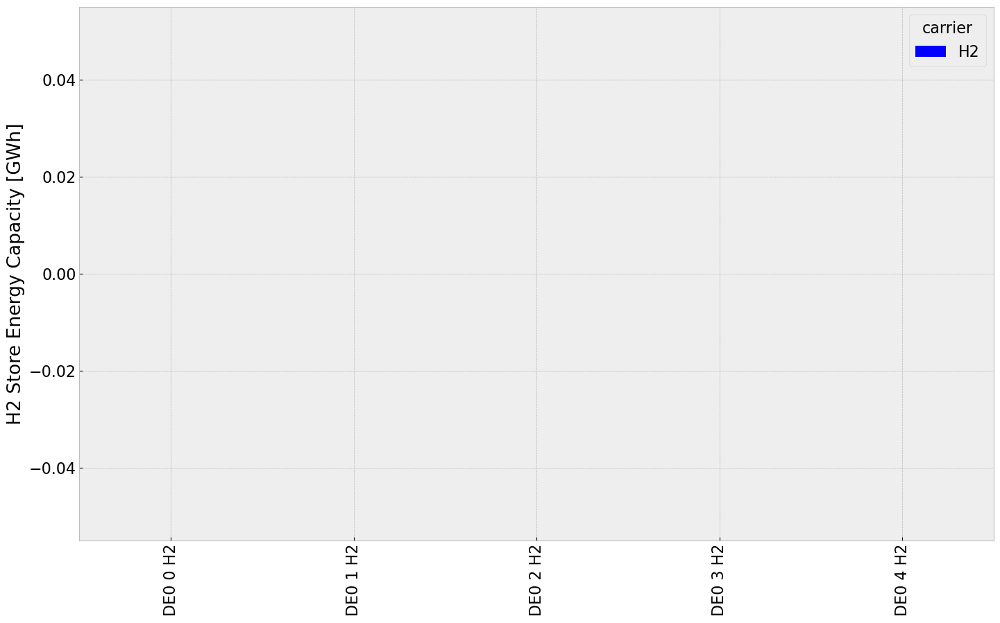

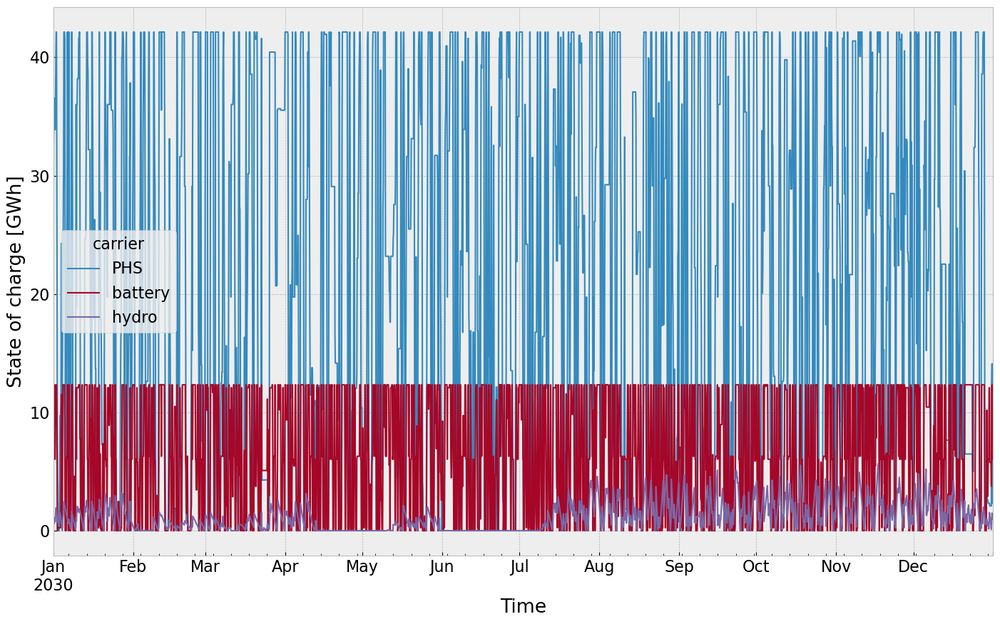

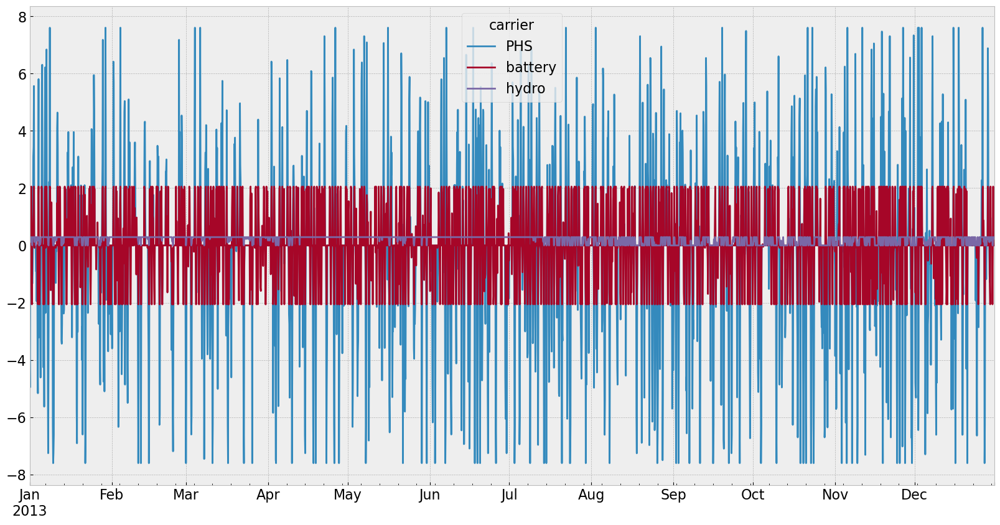

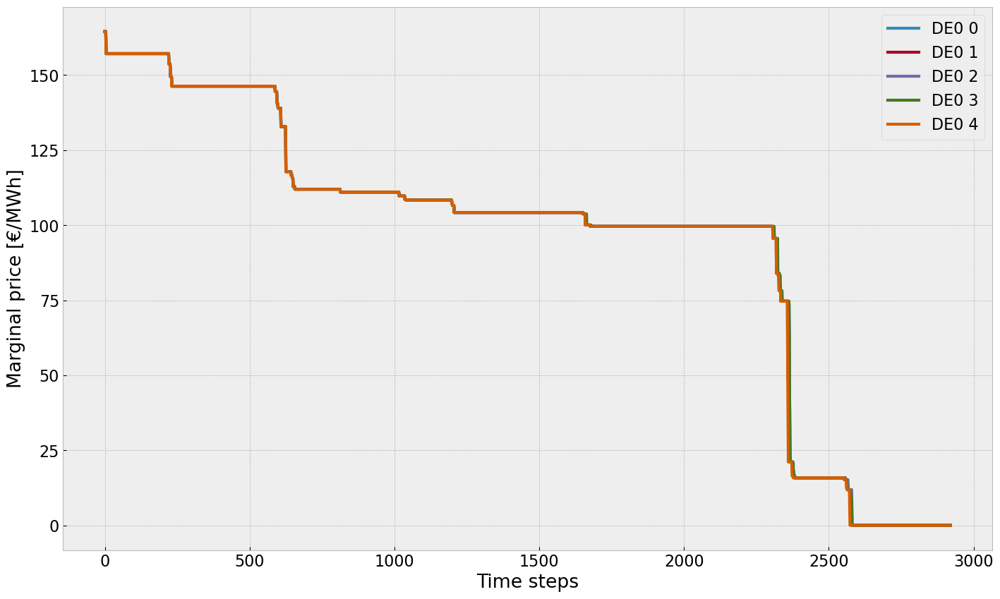

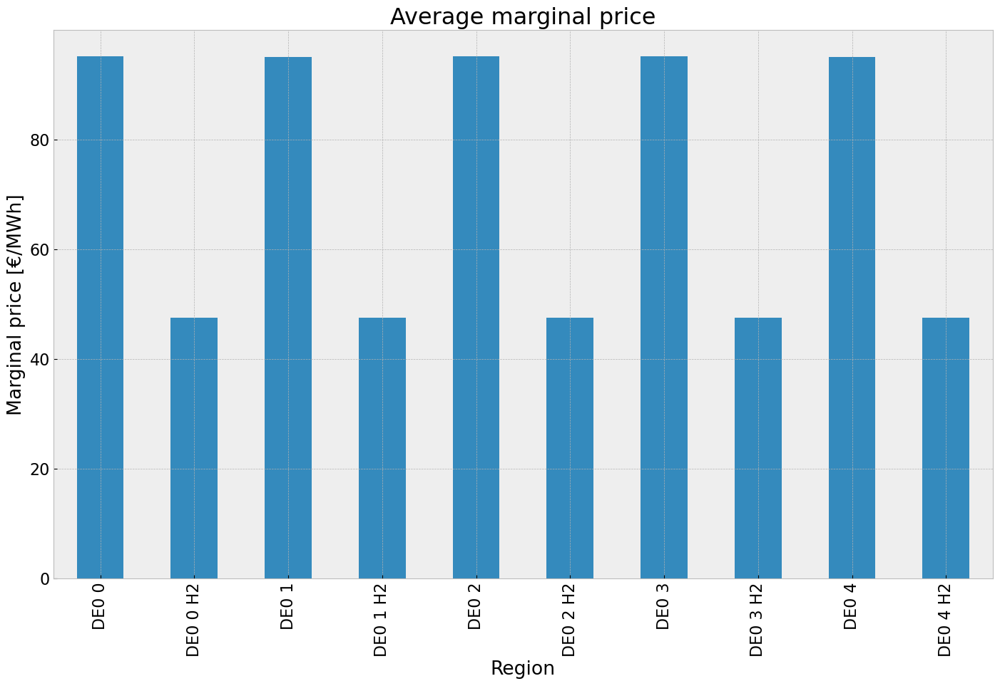

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


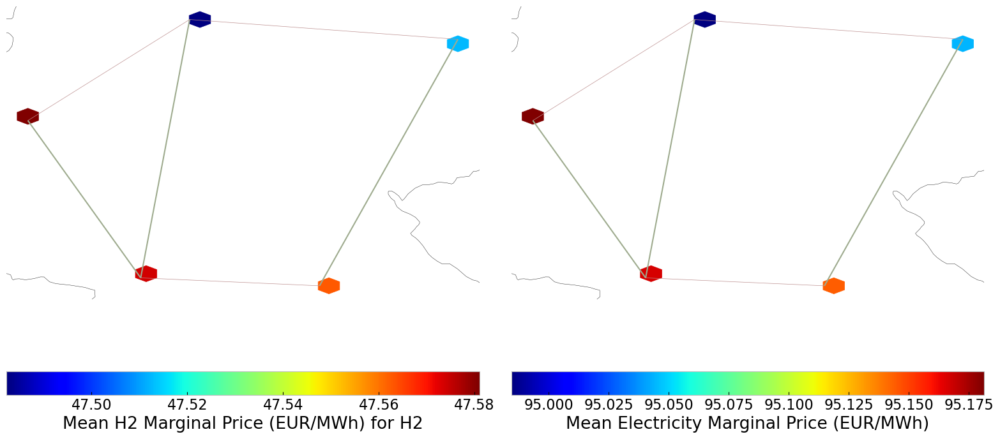

In [65]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
inst_store_table(n3)
inst_storeh2_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

# Scenario Analysis

## Installed Capacity

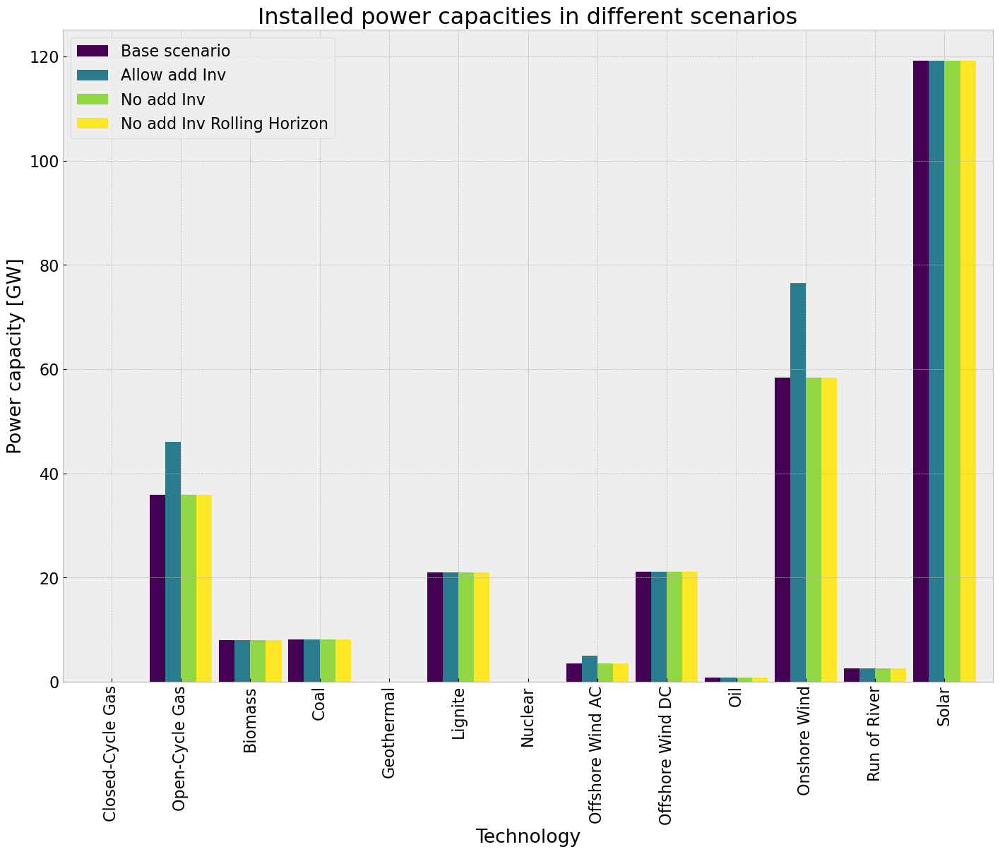

In [66]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [67]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,35.939257,46.054396,35.939257,35.939257
Biomass,8.011736,8.011736,8.011736,8.011736
Coal,8.158220,8.158220,8.158220,8.158220
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,20.999170,20.999170,20.999170,20.999170
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,3.464309,5.004294,3.464309,3.464309
Offshore Wind DC,21.180997,21.180997,21.180997,21.180997


## Power Generation

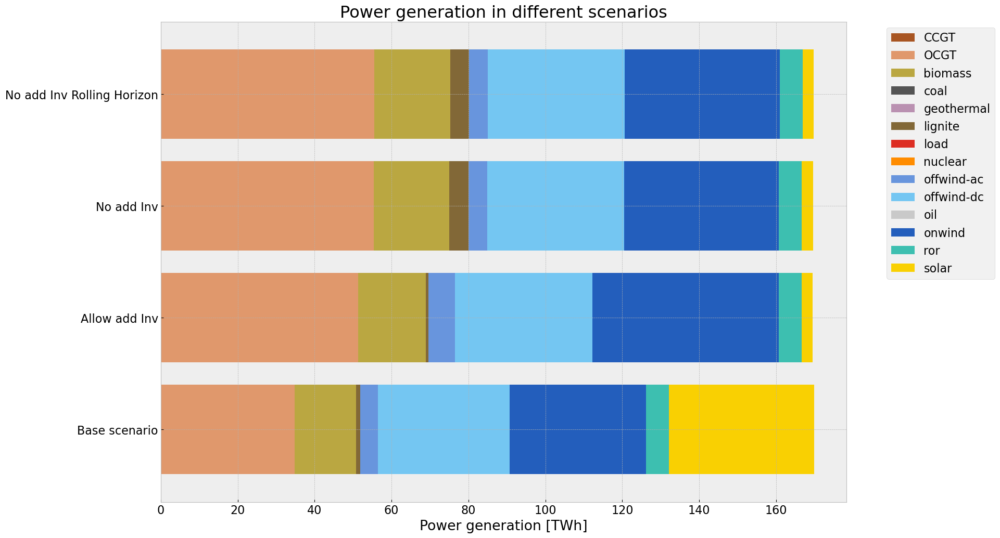

In [68]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [69]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


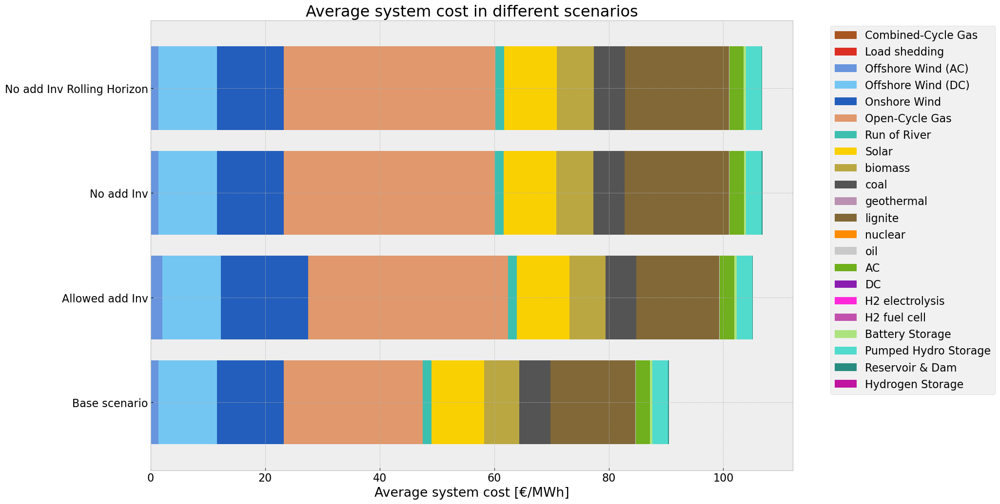

In [70]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [71]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [72]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


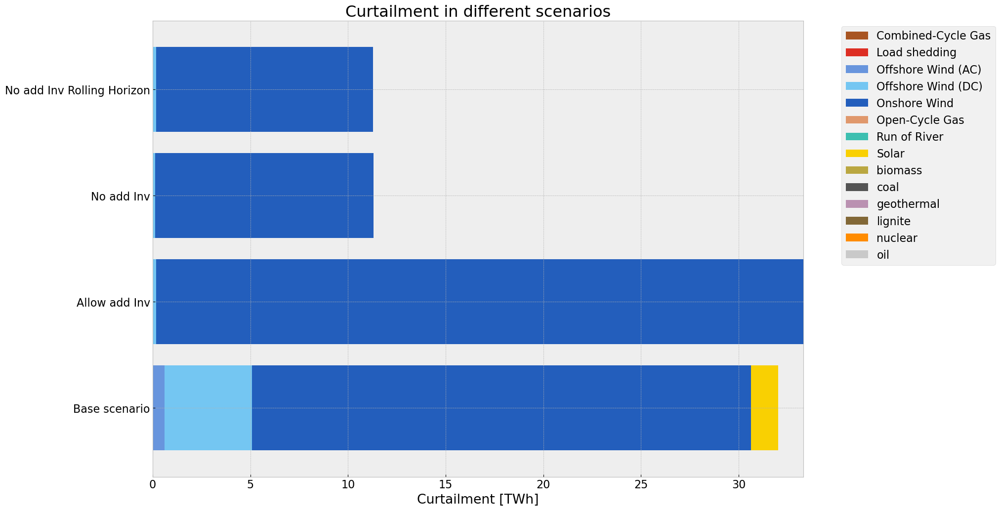

In [73]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8616\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


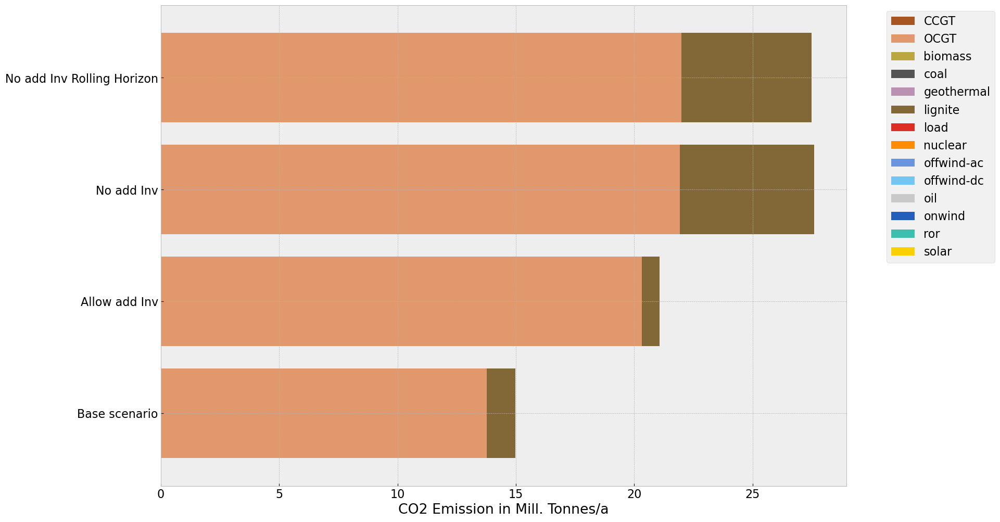

In [74]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()